In [1]:
import pandas as pd
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
from sklearn import model_selection
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
%matplotlib inline
import seaborn as sns
import pandas as pd
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

In [2]:
df=pd.read_csv('file:///C:/Users/Md%20Asif%20Ikbal/Downloads/clean.csv')
df.head()

,bike_name,price,city,kms_driven,owner,age,power,brand
0,TVS Star City Plus Dual Tone 110cc,35000.0,Ahmedabad,17654.0,First Owner,3.0,110.0,TVS
1,Royal Enfield Classic 350cc,119900.0,Delhi,11000.0,First Owner,4.0,350.0,Royal Enfield
2,Triumph Daytona 675R,600000.0,Delhi,110.0,First Owner,8.0,675.0,Triumph
3,TVS Apache RTR 180cc,65000.0,Bangalore,16329.0,First Owner,4.0,180.0,TVS
4,Yamaha FZ S V 2.0 150cc-Ltd. Edition,80000.0,Bangalore,10000.0,First Owner,3.0,150.0,Yamaha


In [3]:
df.shape

(32648, 8)

In [4]:
df.isnull().sum()

bike_name     0
price         0
city          0
kms_driven    0
owner         0
age           0
power         0
brand         0
dtype: int64

In [5]:
df=df.fillna(0)

In [6]:
df.isnull().sum()

bike_name     0
price         0
city          0
kms_driven    0
owner         0
age           0
power         0
brand         0
dtype: int64

In [7]:
df.index

RangeIndex(start=0, stop=32648, step=1)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32648 entries, 0 to 32647
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   bike_name   32648 non-null  object 
 1   price       32648 non-null  float64
 2   city        32648 non-null  object 
 3   kms_driven  32648 non-null  float64
 4   owner       32648 non-null  object 
 5   age         32648 non-null  float64
 6   power       32648 non-null  float64
 7   brand       32648 non-null  object 
dtypes: float64(4), object(4)
memory usage: 2.0+ MB


In [9]:
df.min()

bike_name     BMW F750 GS 850cc
price                    4400.0
city                 24 Pargana
kms_driven                  1.0
owner               First Owner
age                         1.0
power                     100.0
brand                       BMW
dtype: object

In [10]:
df.mean()

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  """Entry point for launching an IPython kernel.


price         68295.417637
kms_driven    26344.625184
age               8.048211
power           213.511302
dtype: float64

In [11]:
df.dtypes

bike_name      object
price         float64
city           object
kms_driven    float64
owner          object
age           float64
power         float64
brand          object
dtype: object

In [12]:
df.max()

bike_name     Yezdi Classic 250cc
price                   1900000.0
city                     Zirakpur
kms_driven               750000.0
owner                 Third Owner
age                          63.0
power                      1800.0
brand                       Yezdi
dtype: object

In [13]:
df.describe()

,price,kms_driven,age,power
count,3.264800e+04,32648.000000,32648.000000,32648.000000
mean,6.829542e+04,26344.625184,8.048211,213.511302
std,9.071860e+04,22208.527695,4.031700,134.428868
min,4.400000e+03,1.000000,1.000000,100.000000
25%,2.500000e+04,12000.000000,5.000000,150.000000
50%,4.300000e+04,20373.000000,7.000000,150.000000
75%,8.000000e+04,35000.000000,10.000000,220.000000
max,1.900000e+06,750000.000000,63.000000,1800.000000


In [14]:
df.corr().describe().T

,count,mean,std,min,25%,50%,75%,max
price,4.0,0.287322,0.746403,-0.399133,-0.335249,0.274210,0.896782,1.0
kms_driven,4.0,0.226678,0.631838,-0.313955,-0.276500,0.110334,0.613513,1.0
age,4.0,0.187129,0.675216,-0.399133,-0.352560,0.073824,0.613513,1.0
power,4.0,0.315331,0.713969,-0.337035,-0.282271,0.299180,0.896782,1.0


In [15]:
for i  in df.columns:
    print(f'unique values in column "{i}" is\n {df[i].value_counts()}')
    print('--------------------------------------------------------------------')

unique values in column "bike_name" is
 Bajaj Pulsar 150cc                                   2776
Bajaj Avenger Street 220                             2531
Bajaj Avenger 220cc                                  2060
Royal Enfield Classic 350cc                          1673
Hero Passion Pro 100cc                               1432
                                                     ... 
Indian Chief Classic 1800cc                             1
TVS Apache RTR 160cc White Race Edition Rear Disc       1
Triumph Bonneville T100 900cc                           1
Bajaj CT110 ES Alloy                                    1
Yamaha FZS FI 150cc Special Edition                     1
Name: bike_name, Length: 471, dtype: int64
--------------------------------------------------------------------
unique values in column "price" is
 25000.0     2071
35000.0     1446
70000.0     1358
18000.0     1356
32000.0     1350
            ... 
73700.0        1
104300.0       1
115204.0       1
386000.0       1
6148

In [16]:
df.skew()

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  """Entry point for launching an IPython kernel.


price         5.780190
kms_driven    6.350266
age           1.193951
power         2.579089
dtype: float64

In [17]:
df.tail()

,bike_name,price,city,kms_driven,owner,age,power,brand
32643,Hero Passion Pro 100cc,39000.0,Delhi,22000.0,First Owner,4.0,100.0,Hero
32644,TVS Apache RTR 180cc,30000.0,Karnal,6639.0,First Owner,9.0,180.0,TVS
32645,Bajaj Avenger Street 220,60000.0,Delhi,20373.0,First Owner,6.0,220.0,Bajaj
32646,Hero Super Splendor 125cc,15600.0,Jaipur,84186.0,First Owner,16.0,125.0,Hero
32647,Bajaj Pulsar 150cc,22000.0,Pune,60857.0,First Owner,13.0,150.0,Bajaj


In [18]:
le=LabelEncoder()

In [19]:
df.columns

Index(['bike_name', 'price', 'city', 'kms_driven', 'owner', 'age', 'power',
       'brand'],
      dtype='object')

In [20]:
df_col=('bike_name',  'city',  'owner', 'age', 'power','brand')

In [21]:
for i in df_col:
    df[i]=le.fit_transform(df[i])

In [22]:
df.head()

,bike_name,price,city,kms_driven,owner,age,power,brand
0,401,35000.0,6,17654.0,0,2,2,19
1,295,119900.0,118,11000.0,0,3,19,17
2,411,600000.0,118,110.0,0,7,28,20
3,375,65000.0,44,16329.0,0,3,9,19
4,426,80000.0,44,10000.0,0,2,6,21


In [23]:
x=df.drop(['price'],axis='columns')
y=df.price.values

In [24]:
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.3,random_state=0)

In [25]:
tre=DecisionTreeClassifier()
tre.fit(xtrain,ytrain)
pred_tre=tre.predict(xtest)
accu_tre=accuracy_score(ytest,pred_tre)*100
accu_tre

80.89841755997959

In [26]:
print(classification_report(ytest,pred_tre))

              precision    recall  f1-score   support

      4400.0       0.00      0.00      0.00         1
      6700.0       0.00      0.00      0.00         0
      6890.0       0.00      0.00      0.00         0
      8000.0       0.00      0.00      0.00         0
      8100.0       0.00      0.00      0.00         0
      9000.0       0.00      0.00      0.00         2
      9350.0       1.00      1.00      1.00         1
      9400.0       0.00      0.00      0.00         1
      9500.0       0.50      0.50      0.50         2
     10000.0       0.98      0.97      0.98       202
     10414.0       0.00      0.00      0.00         0
     10500.0       0.00      0.00      0.00         1
     10951.0       1.00      1.00      1.00         1
     11000.0       1.00      0.38      0.55         8
     11100.0       0.00      0.00      0.00         1
     11900.0       1.00      1.00      1.00       183
     12000.0       0.57      0.31      0.40        13
     12200.0       0.00    

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [27]:
kne=KNeighborsClassifier()
kne.fit(xtrain,ytrain)
pred_kne=kne.predict(xtest)
accu_kne=accuracy_score(ytest,pred_kne)*100
accu_kne

73.20061255742726

In [28]:
print(classification_report(ytest,pred_kne))

              precision    recall  f1-score   support

      4400.0       0.00      0.00      0.00         1
      5000.0       0.00      0.00      0.00         0
      5800.0       0.00      0.00      0.00         0
      6400.0       0.00      0.00      0.00         0
      6700.0       0.00      0.00      0.00         0
      6890.0       0.00      0.00      0.00         0
      8000.0       0.00      0.00      0.00         0
      9000.0       0.09      0.50      0.15         2
      9350.0       0.00      0.00      0.00         1
      9400.0       0.00      0.00      0.00         1
      9500.0       0.00      0.00      0.00         2
     10000.0       0.95      0.97      0.96       202
     10005.0       0.00      0.00      0.00         0
     10414.0       0.00      0.00      0.00         0
     10500.0       0.00      0.00      0.00         1
     10600.0       0.00      0.00      0.00         0
     10800.0       0.00      0.00      0.00         0
     10951.0       1.00    

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [29]:
from sklearn.ensemble import AdaBoostClassifier

In [30]:
ada=AdaBoostClassifier()
ada.fit(xtrain,ytrain)
pred_ada=ada.predict(xtest)
accu_ada=accuracy_score(ytest,pred_ada)*100
accu_ada

9.637570188871873

In [31]:
print(classification_report(ytest,pred_ada))

              precision    recall  f1-score   support

      4400.0       0.00      0.00      0.00         1
      9000.0       0.00      0.00      0.00         2
      9350.0       0.00      0.00      0.00         1
      9400.0       0.00      0.00      0.00         1
      9500.0       0.00      0.00      0.00         2
     10000.0       0.00      0.00      0.00       202
     10500.0       0.00      0.00      0.00         1
     10951.0       0.00      0.00      0.00         1
     11000.0       0.00      0.00      0.00         8
     11100.0       0.00      0.00      0.00         1
     11900.0       0.00      0.00      0.00       183
     12000.0       0.00      0.00      0.00        13
     12200.0       0.00      0.00      0.00         2
     12500.0       0.00      0.00      0.00         1
     12800.0       0.00      0.00      0.00         2
     13000.0       0.00      0.00      0.00         8
     13500.0       0.00      0.00      0.00         1
     13700.0       0.00    

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [32]:
from sklearn.ensemble import BaggingClassifier

In [33]:
bag=BaggingClassifier()
bag.fit(xtrain,ytrain)
pred_bag=bag.predict(xtest)
accu_bag=accuracy_score(ytest,pred_bag)*100
accu_bag

80.70444104134764

In [34]:
print(classification_report(ytest,pred_bag))

              precision    recall  f1-score   support

      4400.0       0.00      0.00      0.00         1
      7000.0       0.00      0.00      0.00         0
      8000.0       0.00      0.00      0.00         0
      9000.0       0.00      0.00      0.00         2
      9350.0       1.00      1.00      1.00         1
      9400.0       0.00      0.00      0.00         1
      9500.0       0.50      0.50      0.50         2
     10000.0       0.97      0.97      0.97       202
     10500.0       0.00      0.00      0.00         1
     10669.0       0.00      0.00      0.00         0
     10951.0       1.00      1.00      1.00         1
     11000.0       1.00      0.38      0.55         8
     11100.0       0.00      0.00      0.00         1
     11900.0       0.99      1.00      1.00       183
     12000.0       0.42      0.38      0.40        13
     12200.0       0.00      0.00      0.00         2
     12500.0       0.00      0.00      0.00         1
     12800.0       0.00    

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [35]:
from sklearn.naive_bayes import GaussianNB

In [36]:
gau=GaussianNB()
gau.fit(xtrain,ytrain)
pred_gau=gau.predict(xtest)
accu_gau=accuracy_score(ytest,pred_gau)*100
accu_gau

61.980602348136806

In [37]:
print(classification_report(ytest,pred_gau))

              precision    recall  f1-score   support

      4400.0       0.00      0.00      0.00         1
      9000.0       0.00      0.00      0.00         2
      9350.0       1.00      1.00      1.00         1
      9400.0       0.00      0.00      0.00         1
      9500.0       0.00      0.00      0.00         2
     10000.0       0.93      0.96      0.94       202
     10500.0       0.00      0.00      0.00         1
     10951.0       1.00      1.00      1.00         1
     11000.0       0.00      0.00      0.00         8
     11100.0       0.00      0.00      0.00         1
     11500.0       0.00      0.00      0.00         0
     11900.0       1.00      1.00      1.00       183
     12000.0       0.00      0.00      0.00        13
     12200.0       0.00      0.00      0.00         2
     12500.0       0.00      0.00      0.00         1
     12800.0       0.00      0.00      0.00         2
     13000.0       0.00      0.00      0.00         8
     13500.0       0.00    

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [42]:
from catboost import CatBoostClassifier

In [44]:
df

,bike_name,price,city,kms_driven,owner,age,power,brand
0,401,35000.0,6,17654.0,0,2,2,19
1,295,119900.0,118,11000.0,0,3,19,17
2,411,600000.0,118,110.0,0,7,28,20
3,375,65000.0,44,16329.0,0,3,9,19
4,426,80000.0,44,10000.0,0,2,6,21
...,...,...,...,...,...,...,...,...
32643,151,39000.0,118,22000.0,0,3,0,5
32644,375,30000.0,224,6639.0,0,8,9,19
32645,15,60000.0,118,20373.0,0,5,11,1
32646,176,15600.0,191,84186.0,0,15,3,5


In [48]:
models = pd.DataFrame({
    'Model': ['DecisionTreeClassifier','KNeighborsClassifier' , 
             'AdaBoostClassifier','BaggingClassifier','GaussianNB'],
    'Score': [accu_tre, accu_kne, accu_ada,accu_bag,accu_gau]
})

models.sort_values(by = 'Score', ascending = False)

,Model,Score
0,DecisionTreeClassifier,80.898418
3,BaggingClassifier,80.704441
1,KNeighborsClassifier,73.200613
4,GaussianNB,61.980602
2,AdaBoostClassifier,9.637570


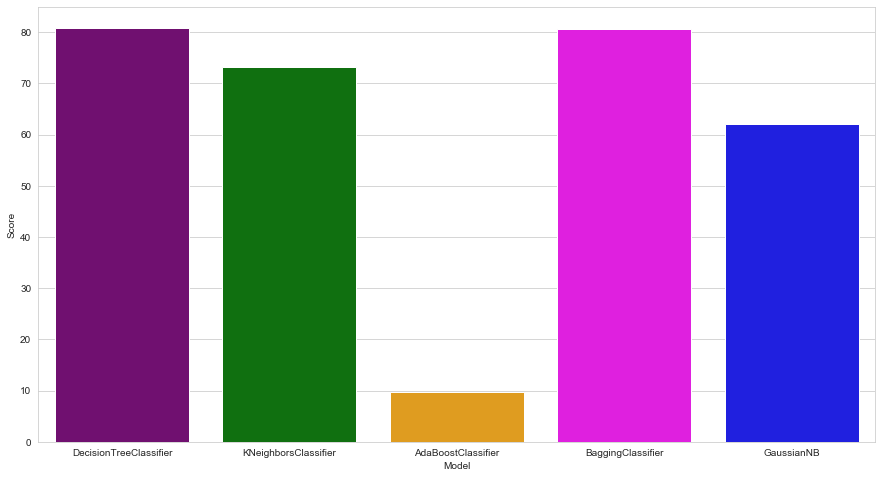

In [49]:
colors = ["purple", "green", "orange", "magenta","blue","black","red"]

sns.set_style("whitegrid")
plt.figure(figsize=(15,8))
plt.ylabel("Accuracy %")
plt.xlabel("Algorithms")
sns.barplot(x=models['Model'],y=models['Score'], palette=colors )
plt.show()

In [51]:
df.head()

,bike_name,price,city,kms_driven,owner,age,power,brand
0,401,35000.0,6,17654.0,0,2,2,19
1,295,119900.0,118,11000.0,0,3,19,17
2,411,600000.0,118,110.0,0,7,28,20
3,375,65000.0,44,16329.0,0,3,9,19
4,426,80000.0,44,10000.0,0,2,6,21


In [52]:
import sklearn.cluster as cluster

In [53]:
kmns=cluster.KMeans(n_clusters=5)
kmns=kmns.fit(df[['power','brand']])

In [54]:
kmns.cluster_centers_

array([[25.98471338,  2.86878981],
       [ 0.72872661,  4.29511165],
       [ 6.39675561, 19.94163129],
       [ 8.54081633,  2.31379529],
       [19.60188028, 15.96584804]])

In [55]:
df['power by brand']=kmns.labels_

In [56]:
from sklearn.cluster import KMeans 

In [57]:
k_range=range(1,15)
wss=[]

In [58]:
for k in k_range:
    km=KMeans(n_clusters=k)
    km.fit(df[['power','brand']])
    wss.append(km.inertia_)

In [59]:
wss

[3690845.0158968396,
 1706653.2530290969,
 885603.5528379992,
 584710.4272964201,
 347061.27970757516,
 261392.87776782957,
 220296.08108707427,
 179449.96330782963,
 140934.47226367964,
 114003.04502709837,
 96652.5960229118,
 78404.1626627136,
 63176.77351850518,
 52369.92453818851]

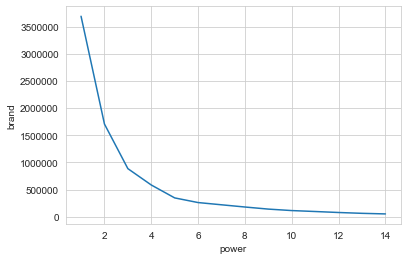

In [60]:
plt.xlabel('power')
plt.ylabel('brand')
plt.plot(k_range,wss)

In [61]:
kmns=cluster.KMeans(n_clusters=9)
kmns.fit(df[['power','kms_driven']])

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=9, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [62]:
kmns.cluster_centers_

array([[7.13314547e+00, 6.27068492e+04],
       [8.81964457e+00, 2.08752051e+04],
       [2.50000000e+00, 6.17207625e+05],
       [1.19347723e+01, 5.07604443e+03],
       [7.03821848e+00, 4.61192383e+04],
       [1.04375000e+01, 2.52602938e+05],
       [1.17289126e+01, 1.35045954e+04],
       [3.85012594e+00, 8.52747380e+04],
       [6.49651972e+00, 3.23774724e+04]])

In [63]:
from sklearn.cluster import KMeans 

In [64]:
k_range=range(1,13)
wss=[]

In [65]:
for k in k_range:
    km=KMeans(n_clusters=k)
    km.fit(df[['power','kms_driven']])
    wss.append(km.inertia_)

In [66]:
wss

[16102112729004.191,
 6944679062464.97,
 4321171775027.1367,
 2434271328322.971,
 1605932608998.2349,
 1150221398084.2114,
 791765511669.092,
 563930571295.2513,
 411403935329.68726,
 332238115269.6265,
 273455146842.617,
 222374627750.58752]

In [68]:
df['power by kms_driven']=kmns.labels_

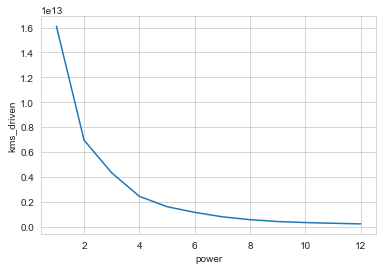

In [67]:
plt.xlabel('power')
plt.ylabel('kms_driven')
plt.plot(k_range,wss)

In [69]:
df.head()

,bike_name,price,city,kms_driven,owner,age,power,brand,power by brand,power by kms_driven
0,401,35000.0,6,17654.0,0,2,2,19,2,1
1,295,119900.0,118,11000.0,0,3,19,17,4,6
2,411,600000.0,118,110.0,0,7,28,20,4,3
3,375,65000.0,44,16329.0,0,3,9,19,2,6
4,426,80000.0,44,10000.0,0,2,6,21,2,6


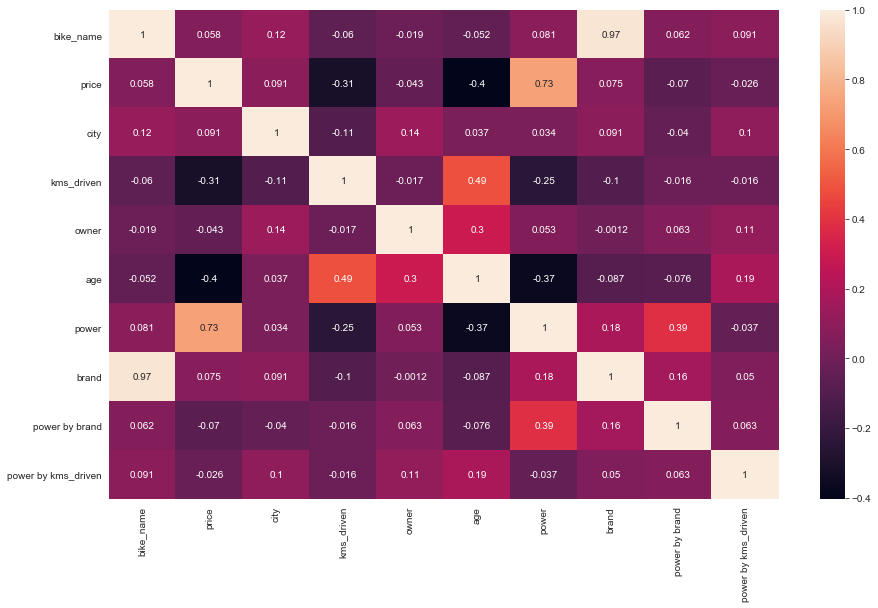

In [70]:
plt.figure(figsize=(15,9))
sns.heatmap(df.corr(),annot=True)

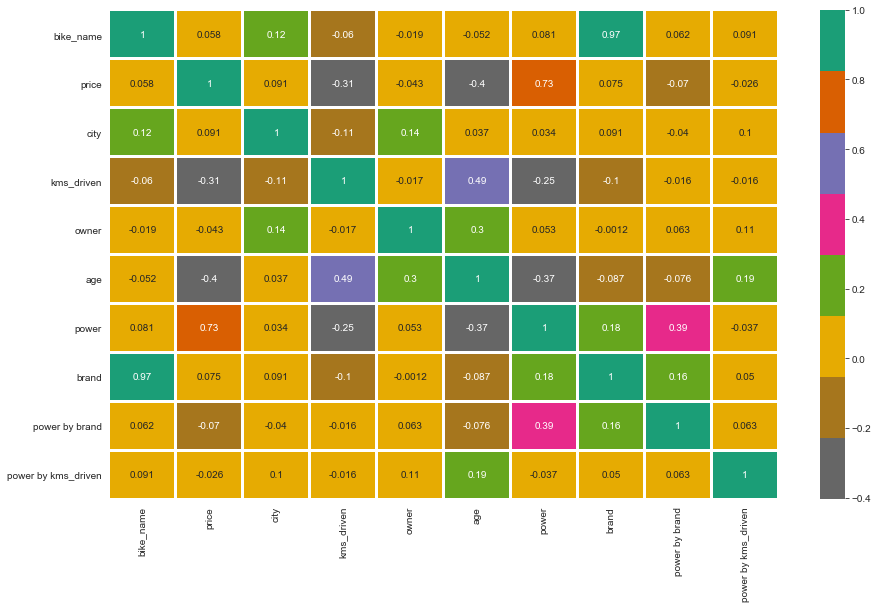

In [71]:
plt.figure(figsize=(15,9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(df.corr(),annot=True,cmap='Dark2_r',linewidths=2)
plt.show()

In [72]:
df.columns

Index(['bike_name', 'price', 'city', 'kms_driven', 'owner', 'age', 'power',
       'brand', 'power by brand', 'power by kms_driven'],
      dtype='object')

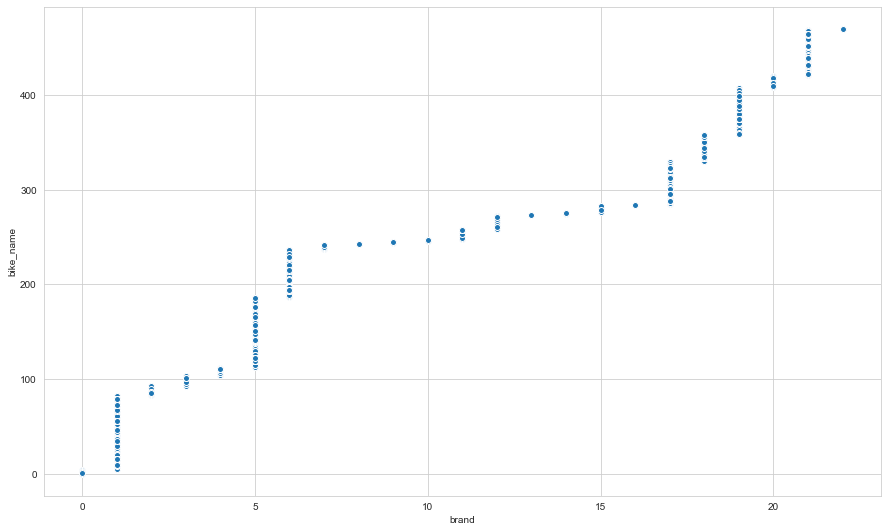

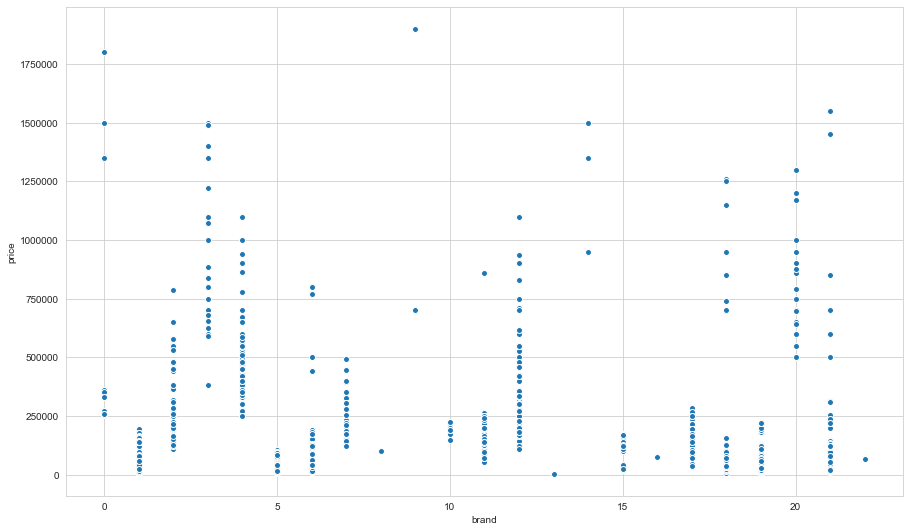

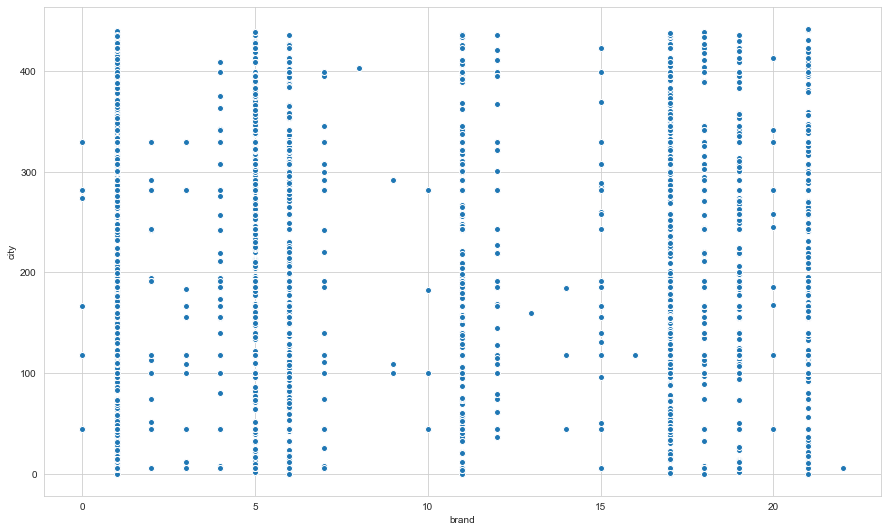

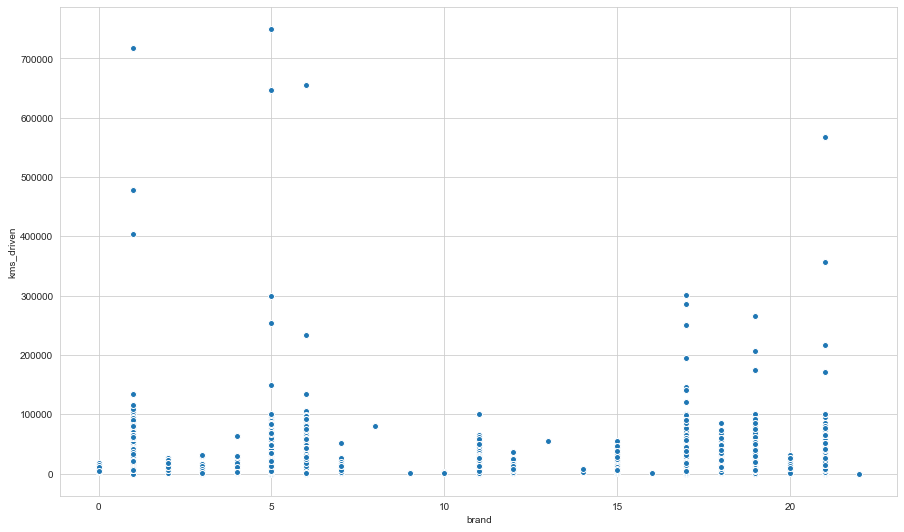

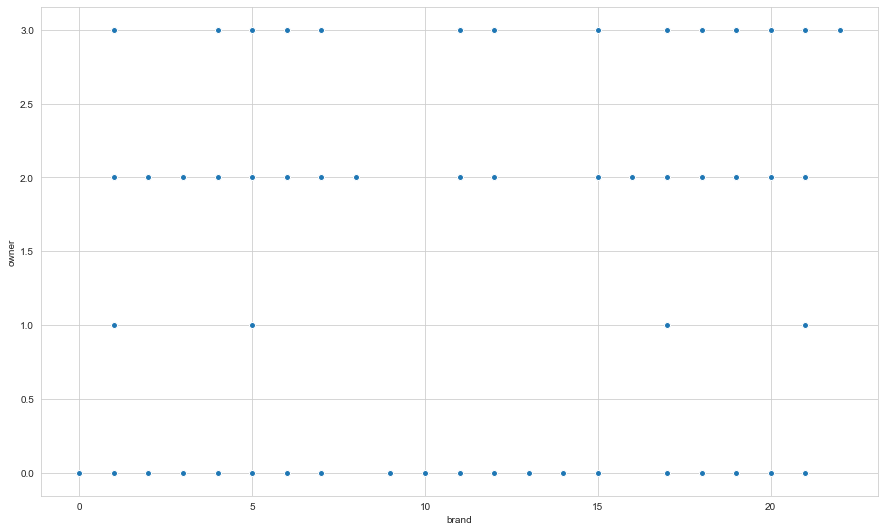

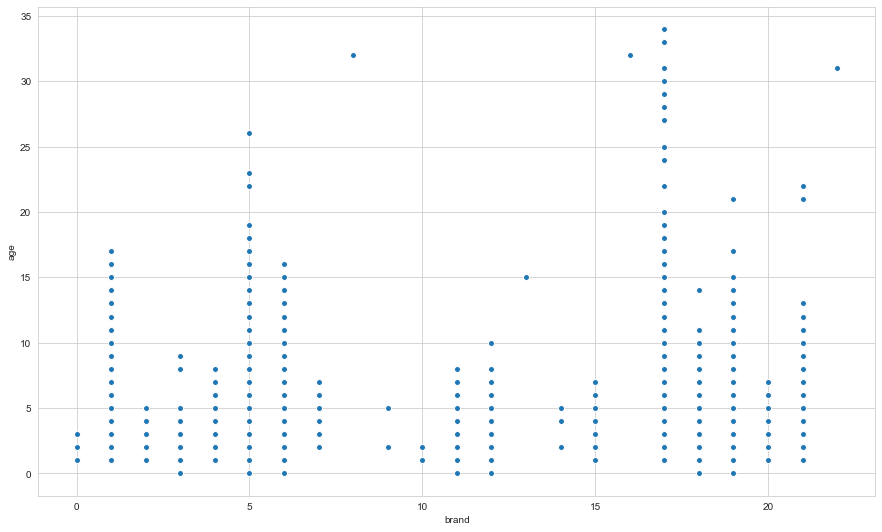

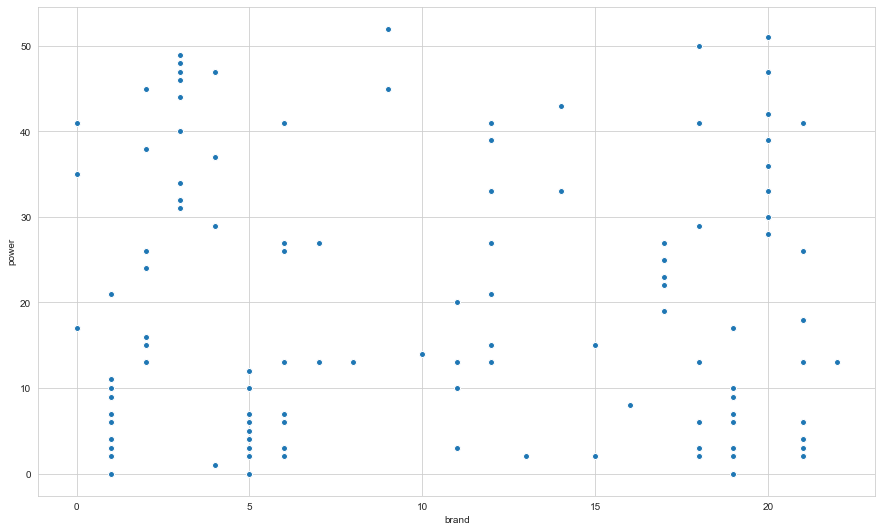

In [76]:
for i in ['bike_name', 'price', 'city', 'kms_driven', 'owner', 'age', 'power']:
    plt.figure(figsize=(15,9))
    sns.scatterplot(x=df.brand,y=df[i],data=df,linewidth=1)
    plt.show()

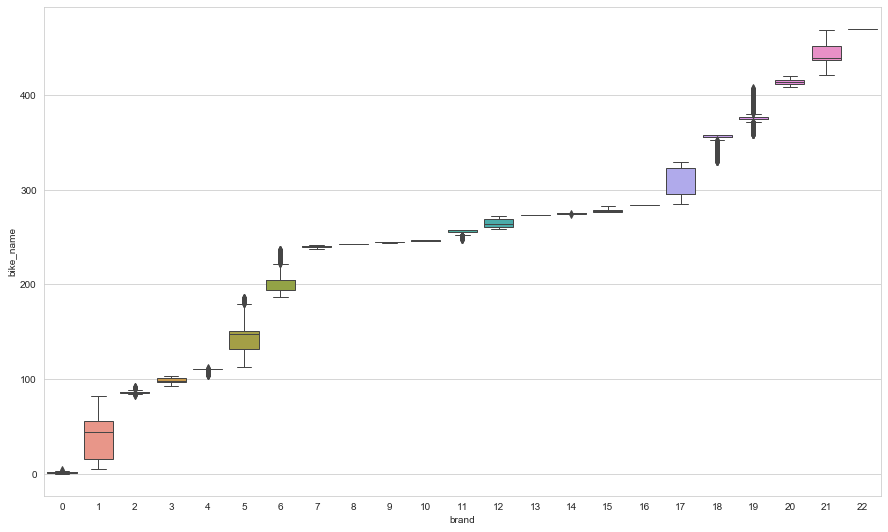

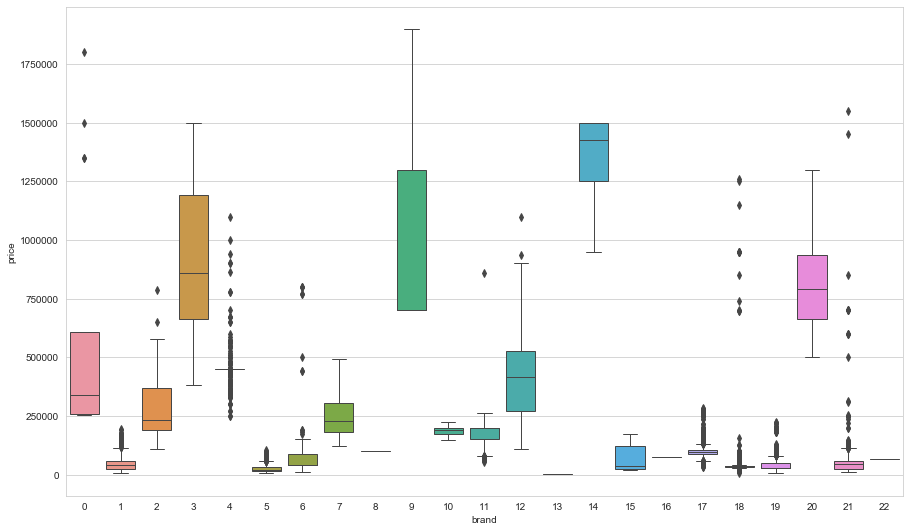

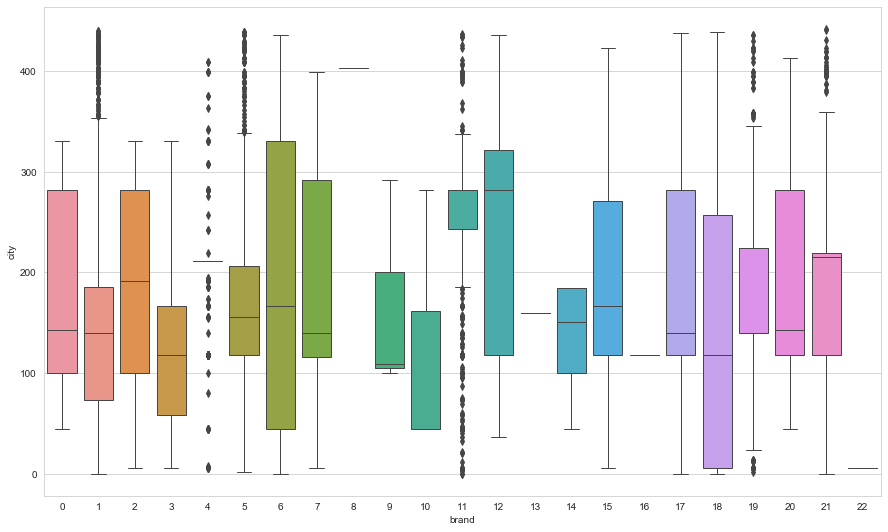

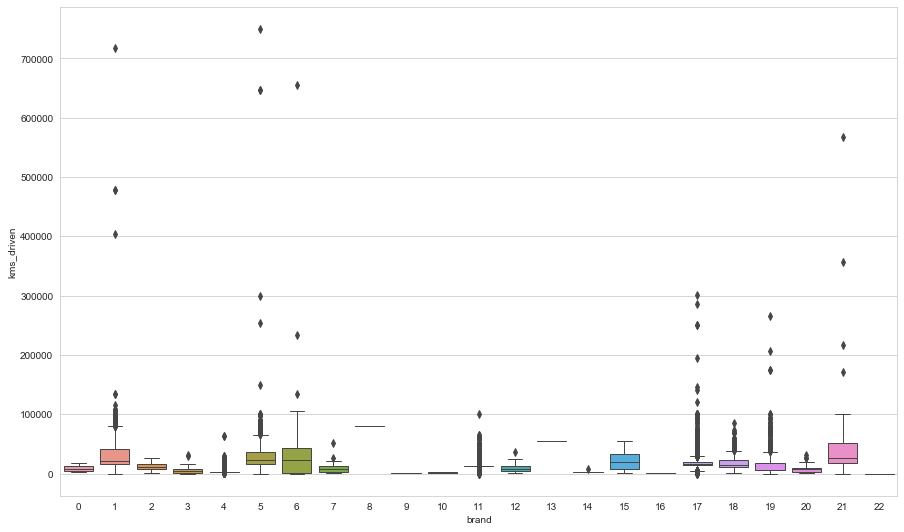

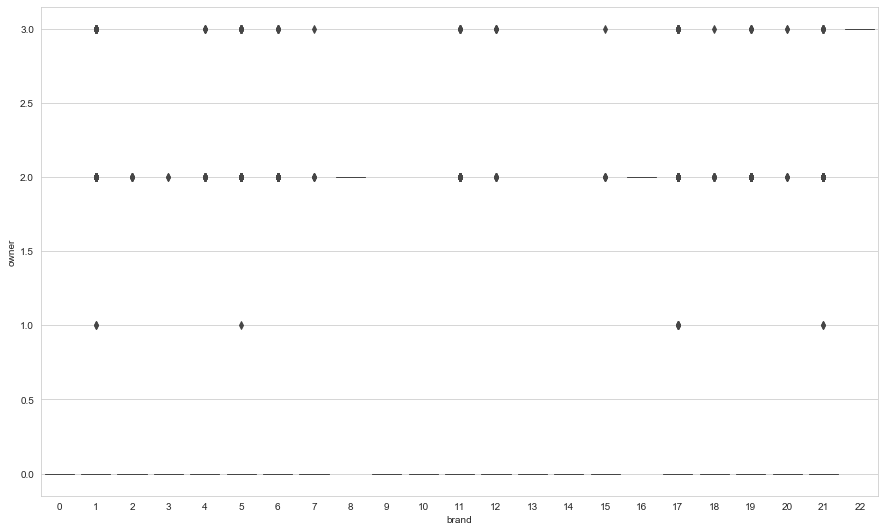

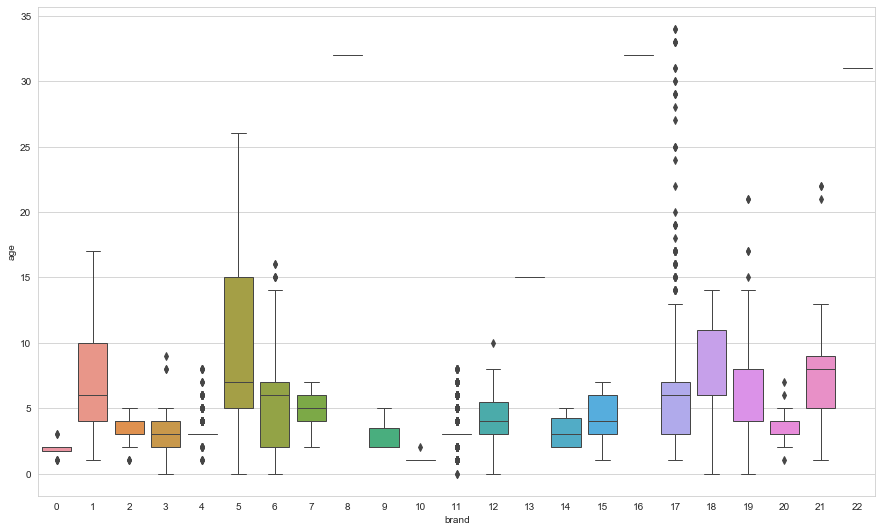

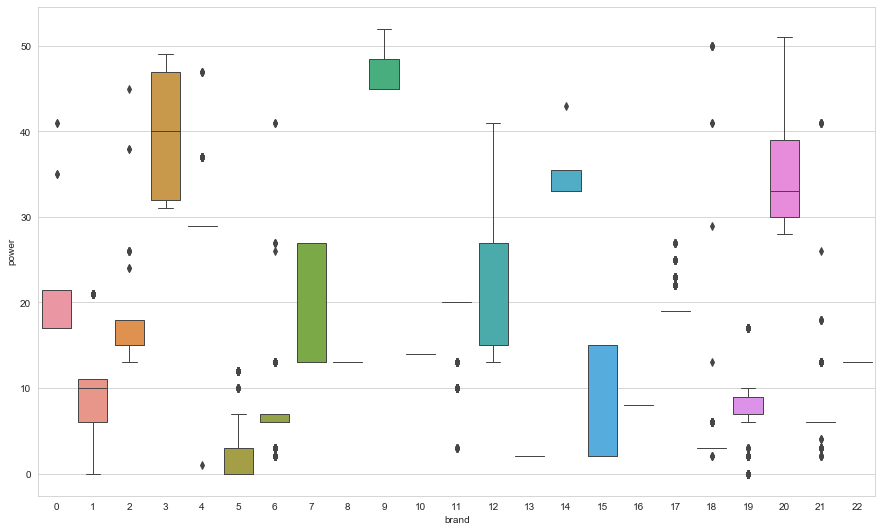

In [77]:
for i in ['bike_name', 'price', 'city', 'kms_driven', 'owner', 'age', 'power']:
    plt.figure(figsize=(15,9))
    sns.boxplot(x=df.brand,y=df[i],data=df,linewidth=1)
    plt.show()

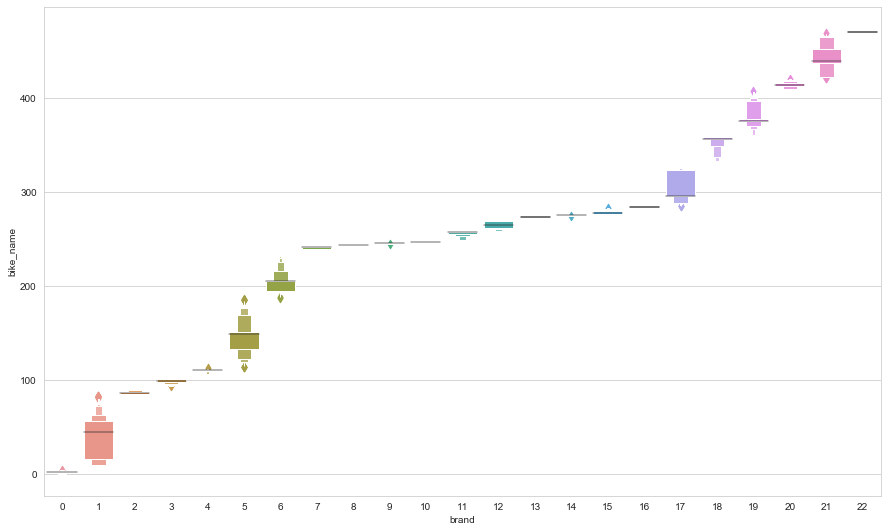

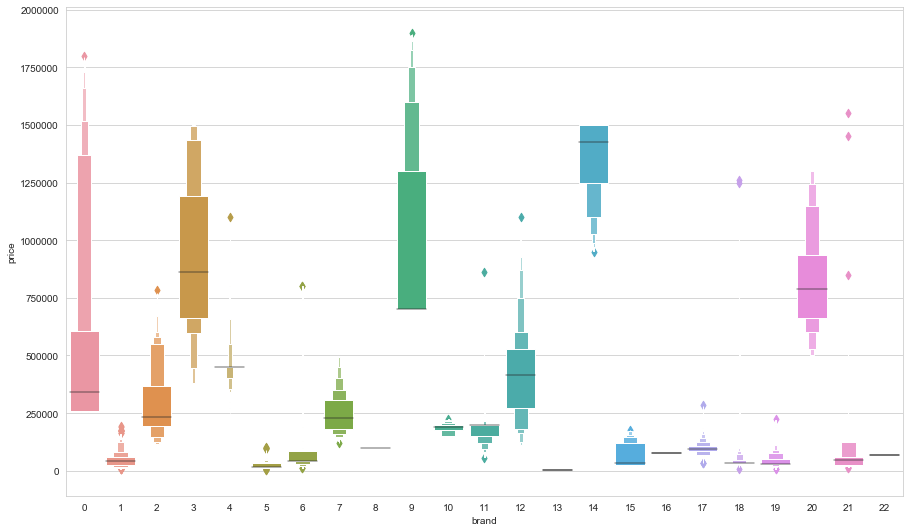

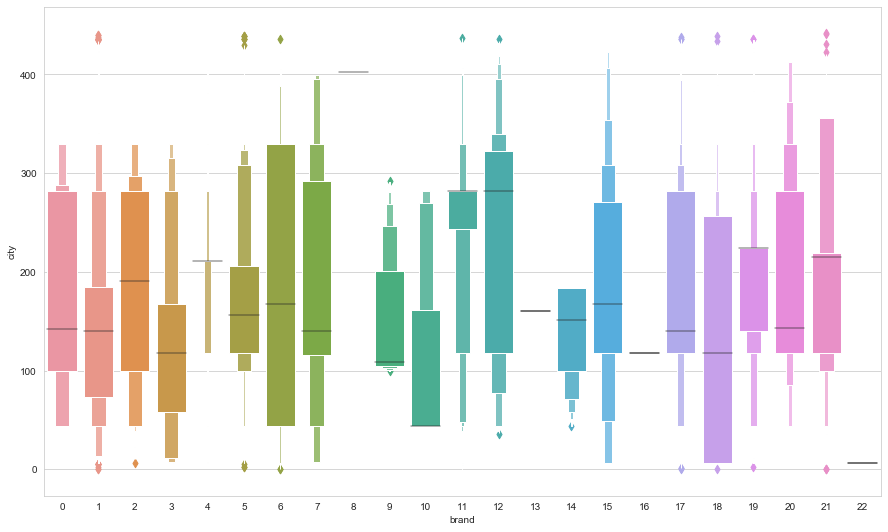

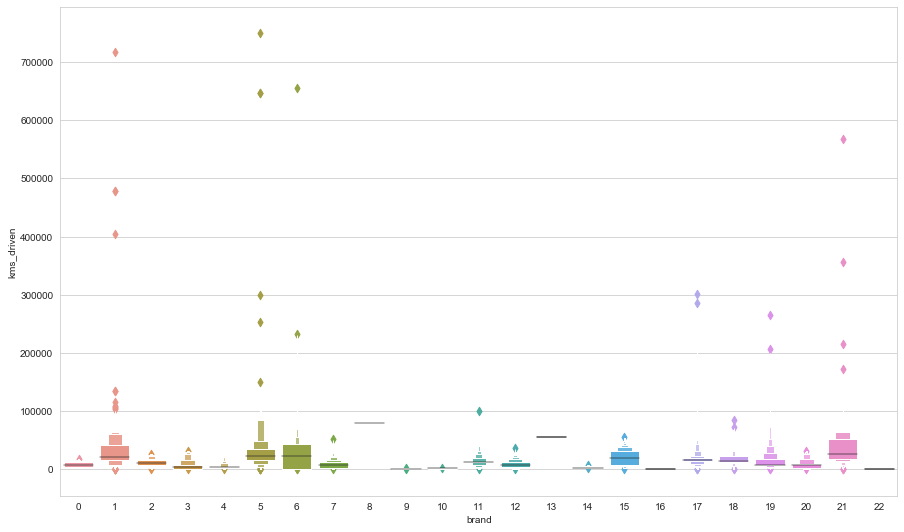

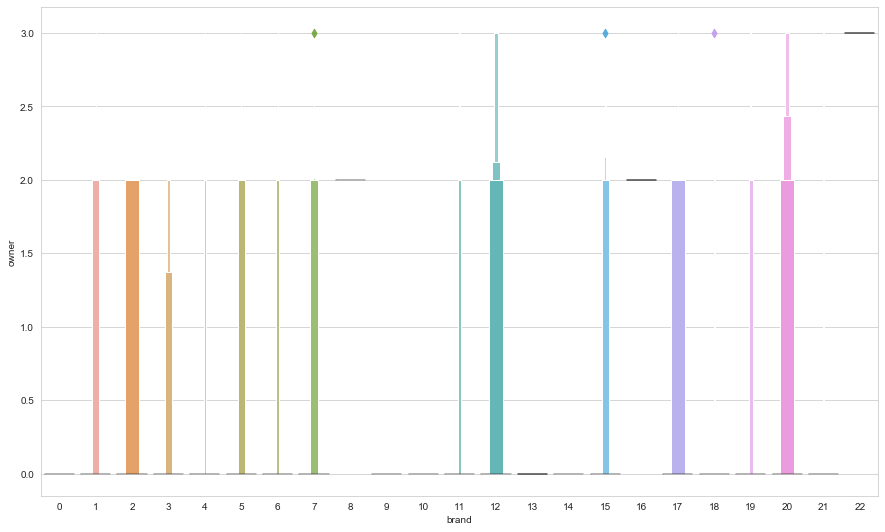

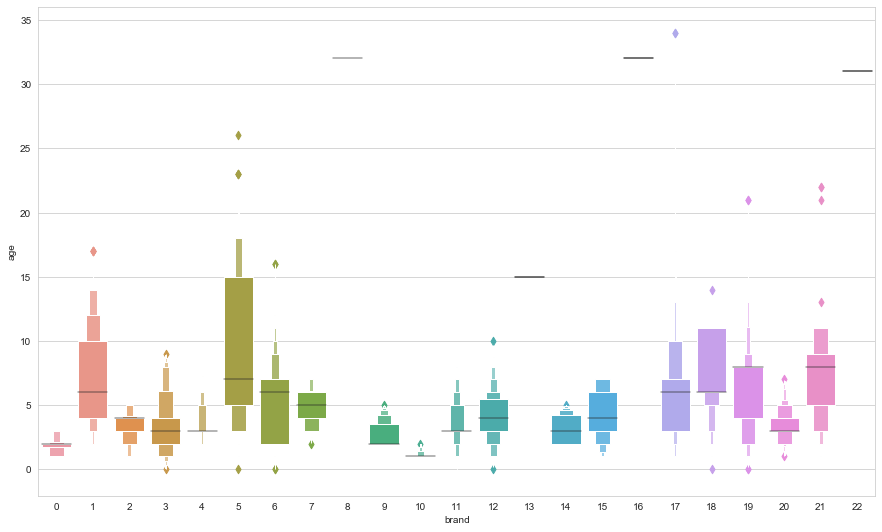

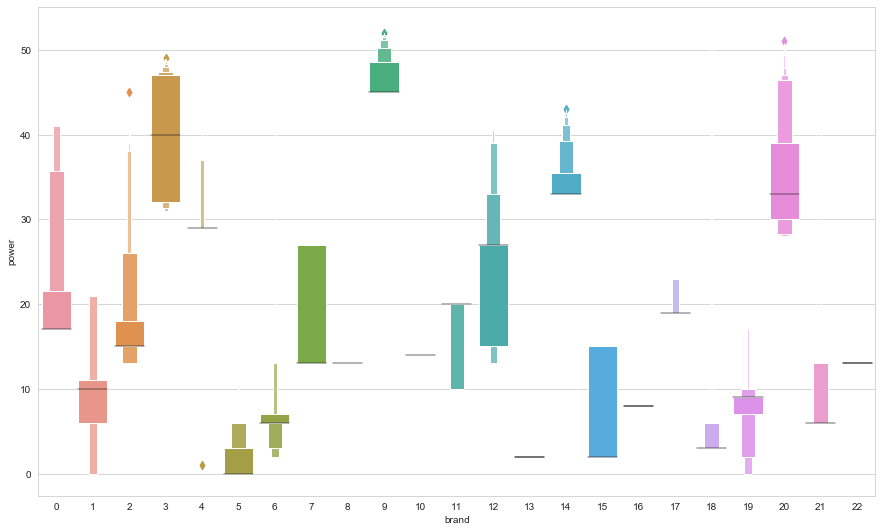

In [78]:
for i in ['bike_name', 'price', 'city', 'kms_driven', 'owner', 'age', 'power']:
    plt.figure(figsize=(15,9))
    sns.boxenplot(x=df.brand,y=df[i],data=df,linewidth=1)
    plt.show()

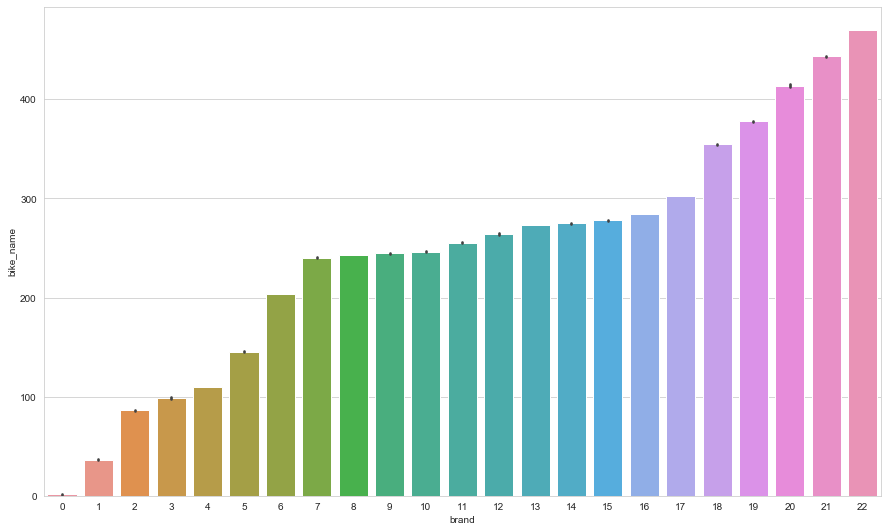

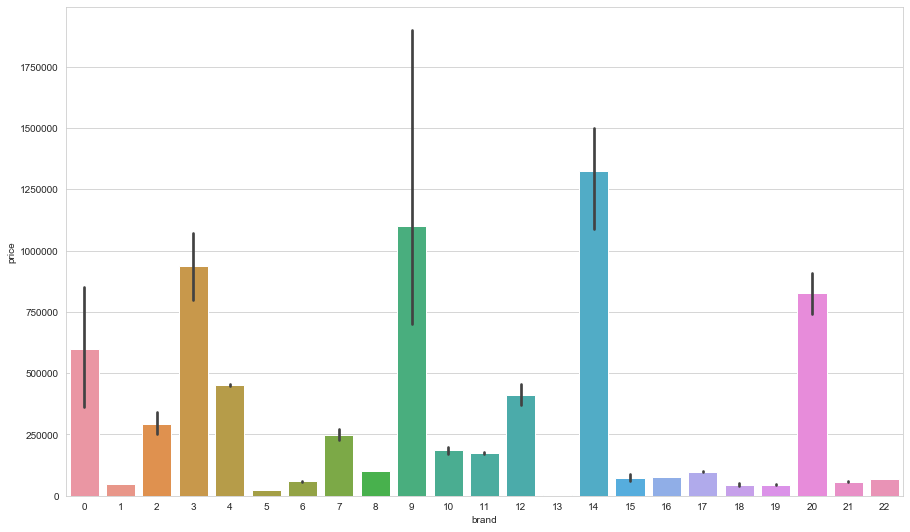

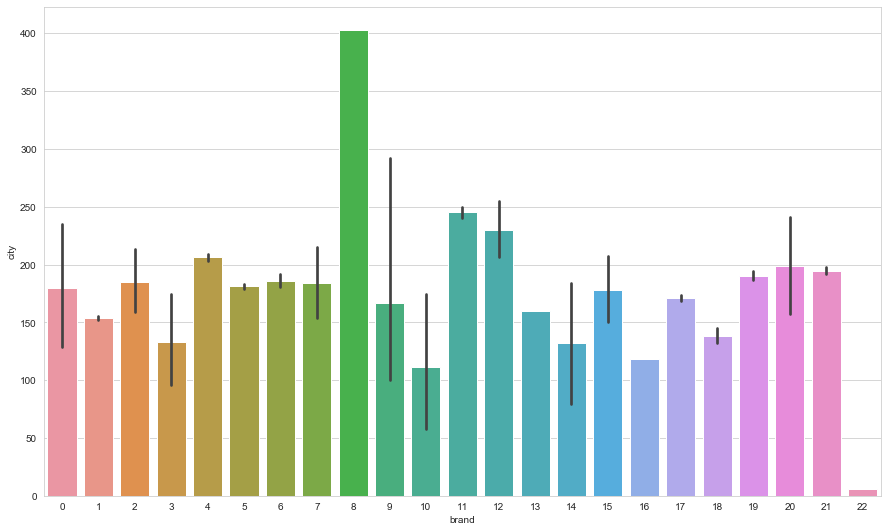

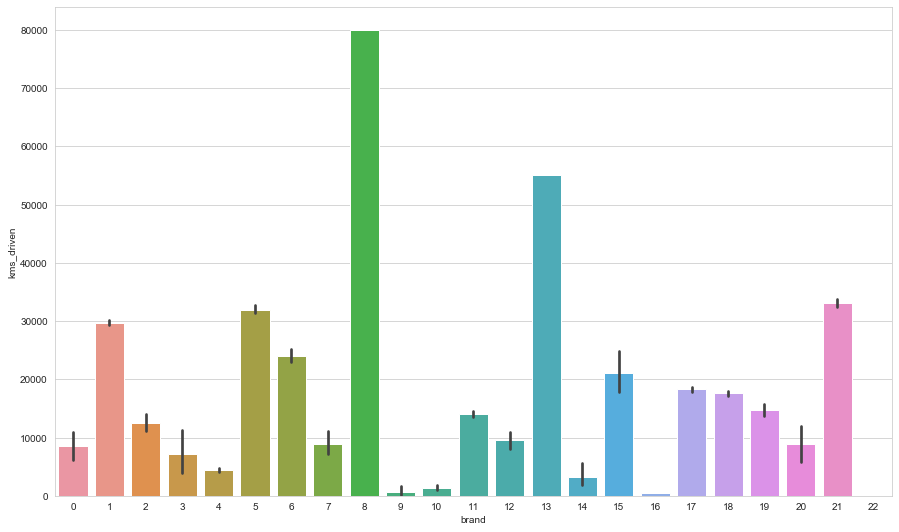

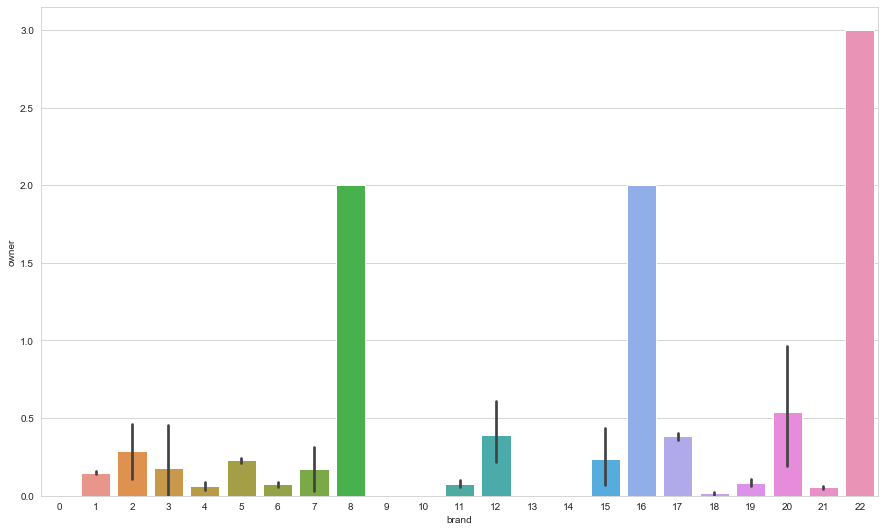

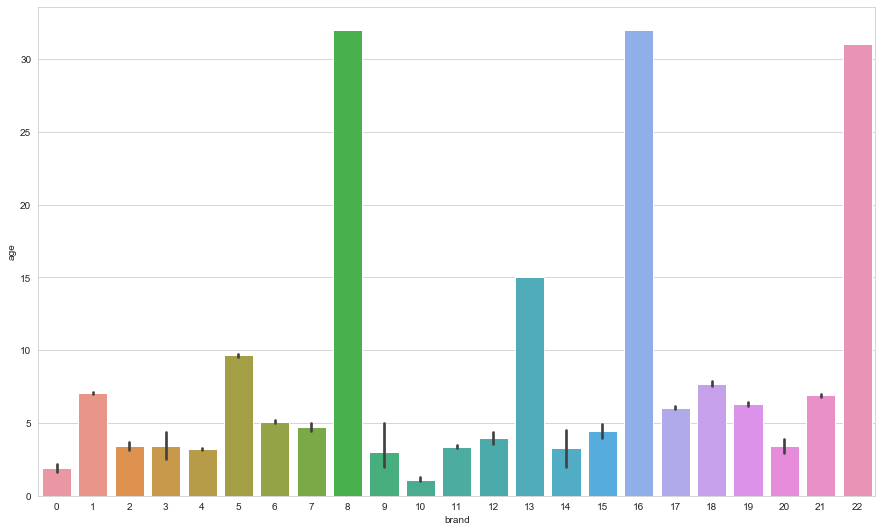

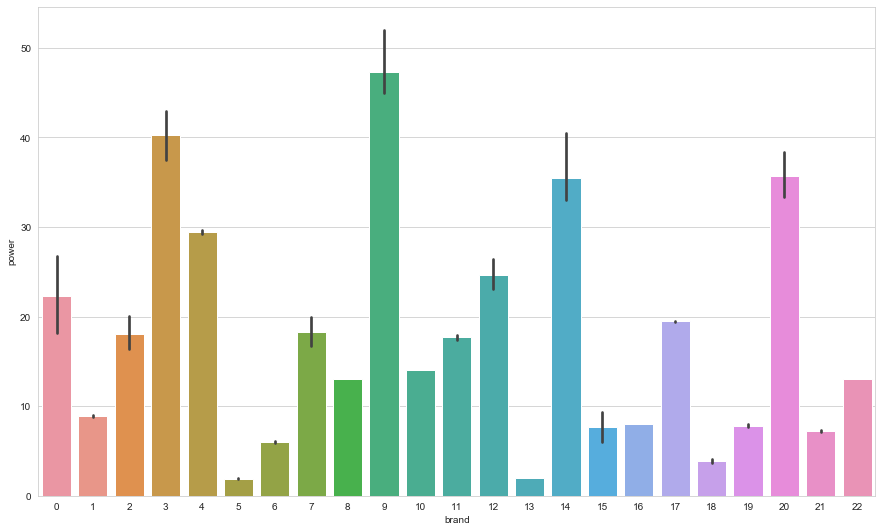

In [79]:
for i in ['bike_name', 'price', 'city', 'kms_driven', 'owner', 'age', 'power']:
    plt.figure(figsize=(15,9))
    sns.barplot(x=df.brand,y=df[i],data=df,linewidth=1)
    plt.show()

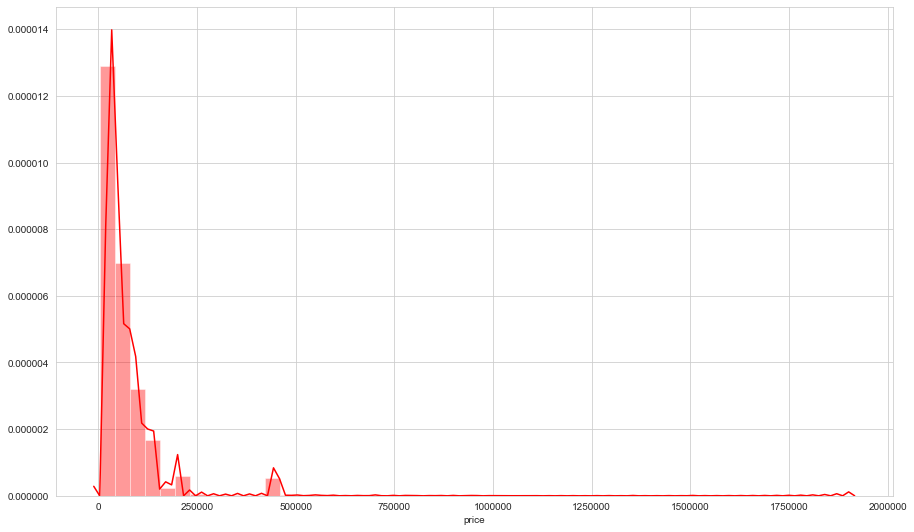

In [80]:
plt.figure(figsize=(15,9))
sns.distplot(df['price'],color='red')

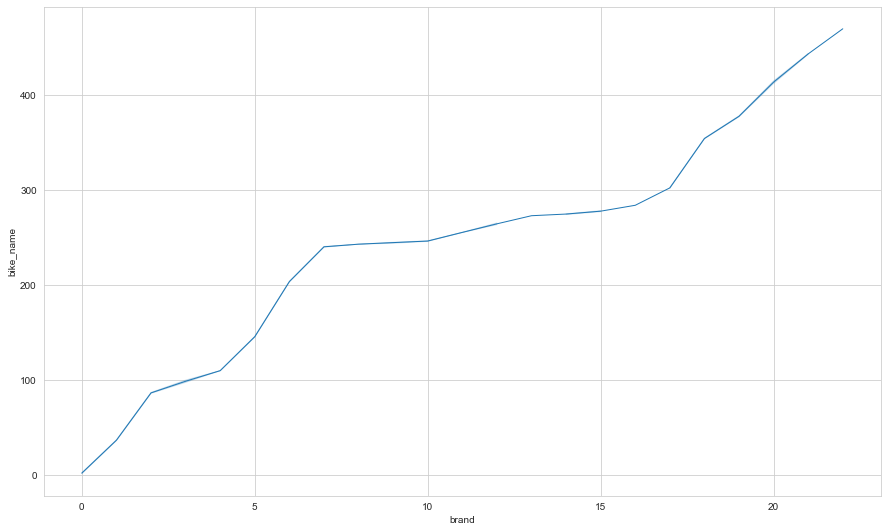

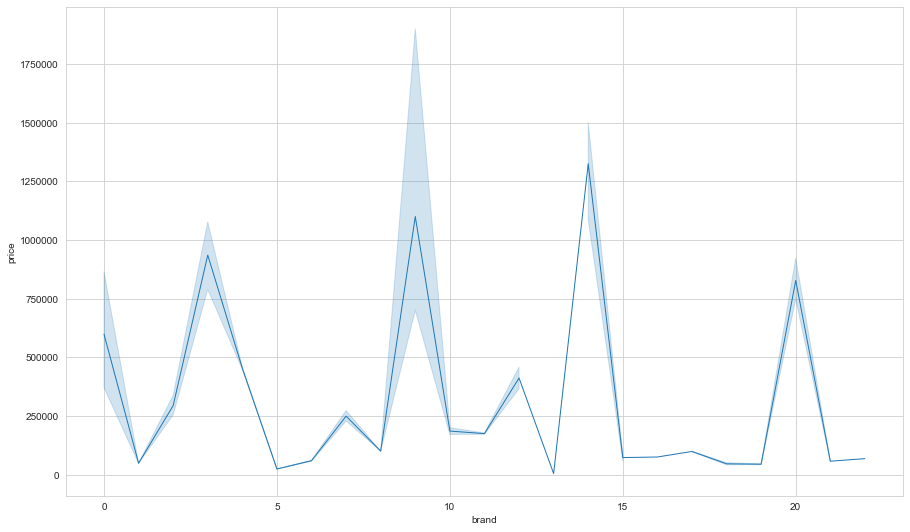

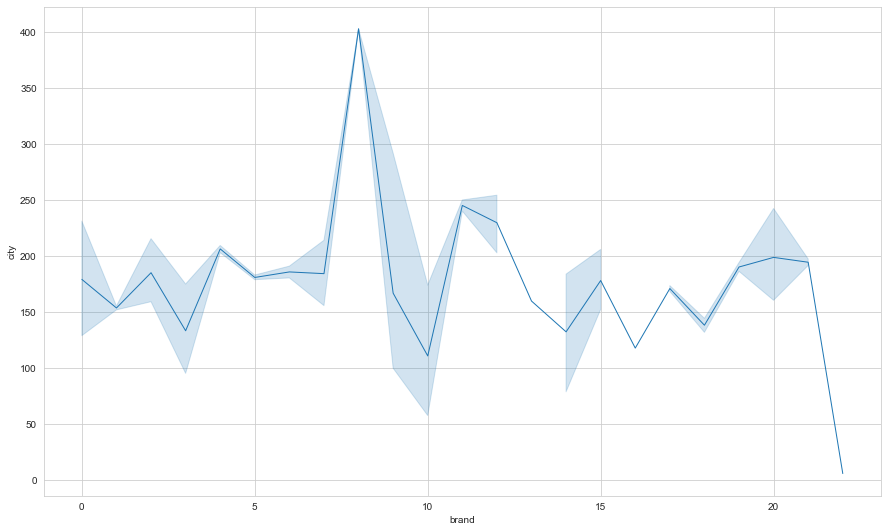

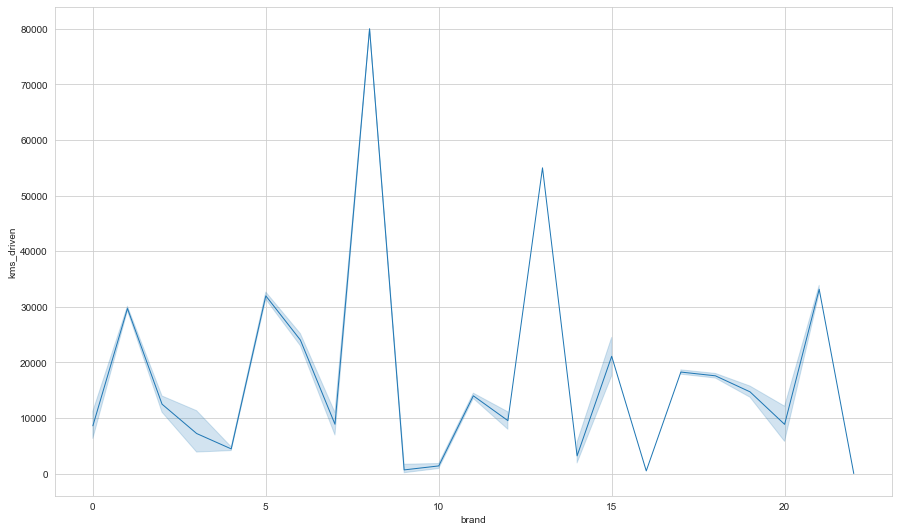

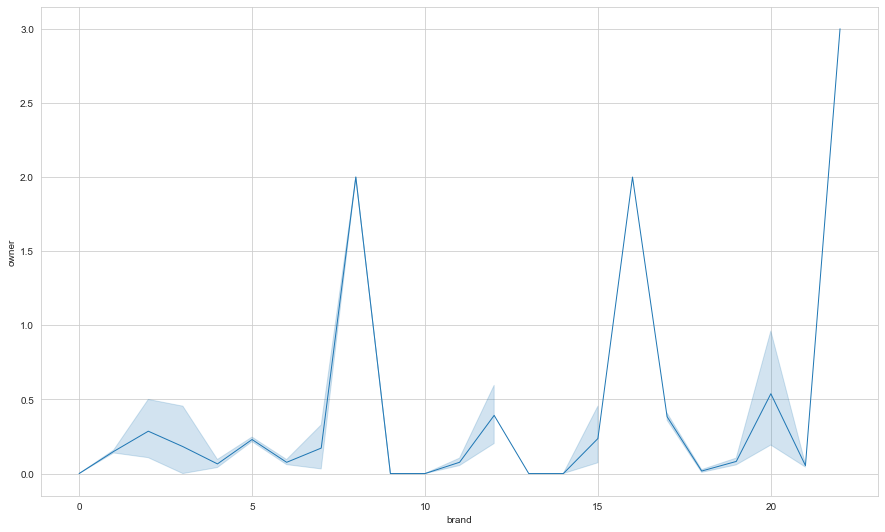

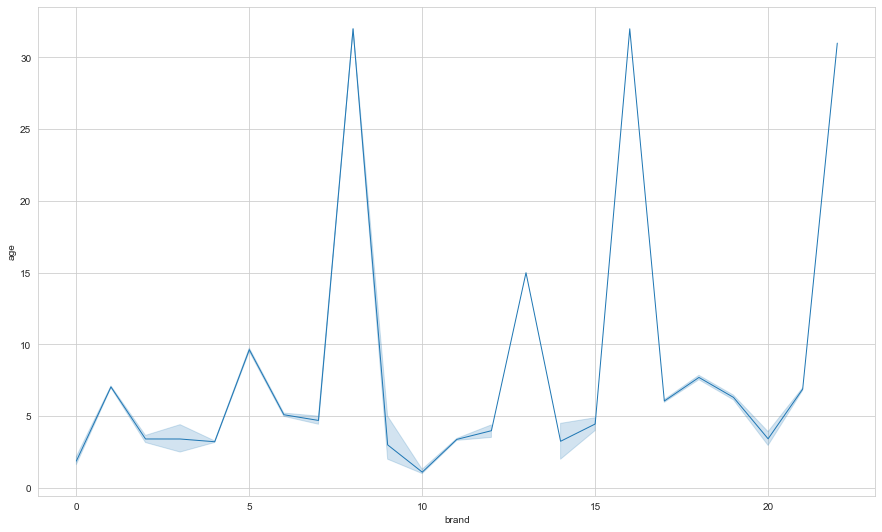

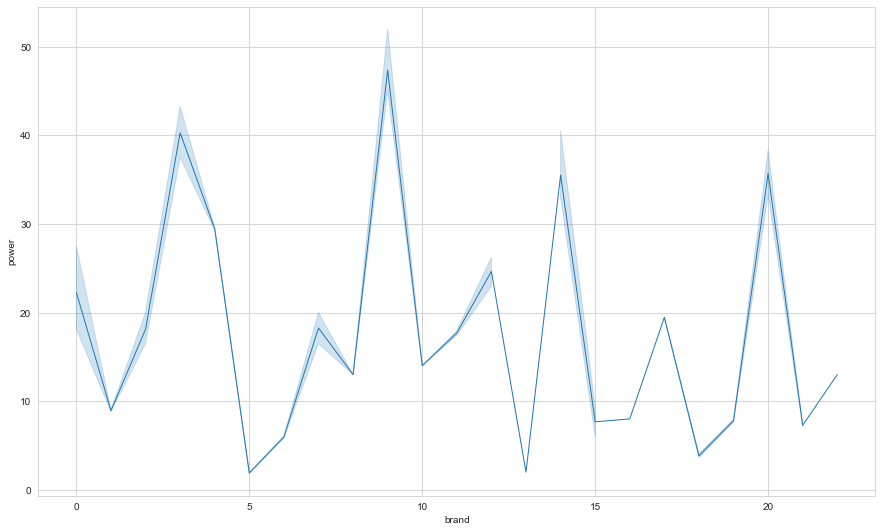

In [81]:
for i in ['bike_name', 'price', 'city', 'kms_driven', 'owner', 'age', 'power']:
    plt.figure(figsize=(15,9))
    sns.lineplot(x=df.brand,y=df[i],data=df,linewidth=1)
    plt.show()

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


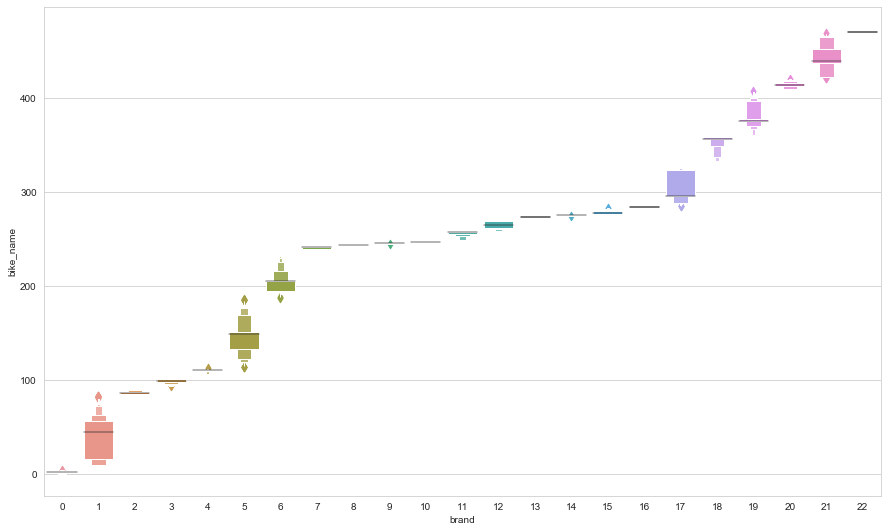

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


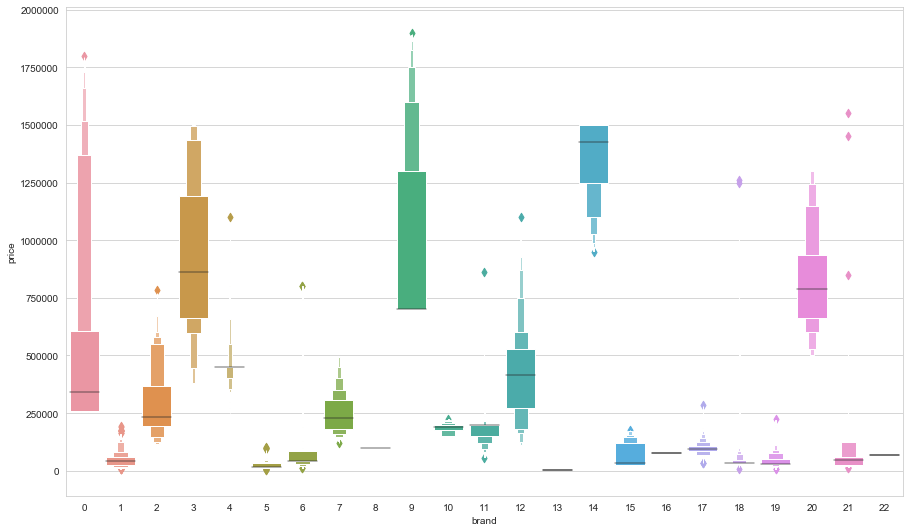

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


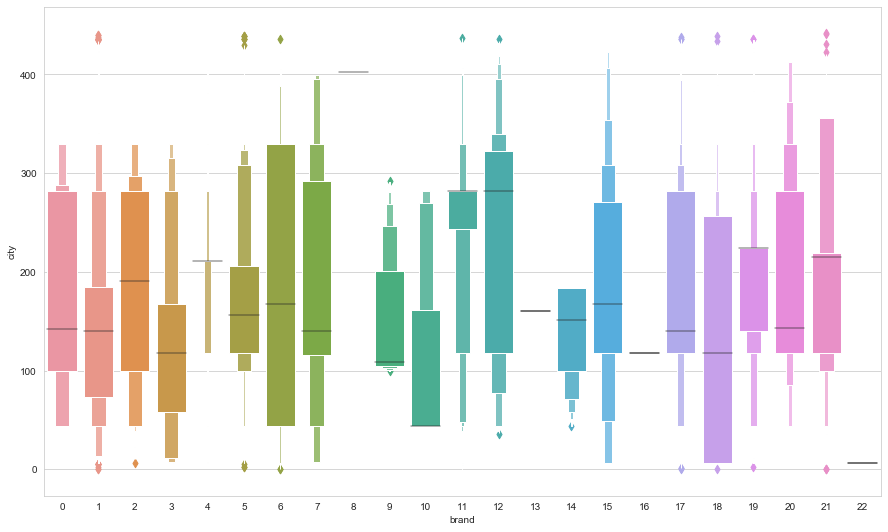

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


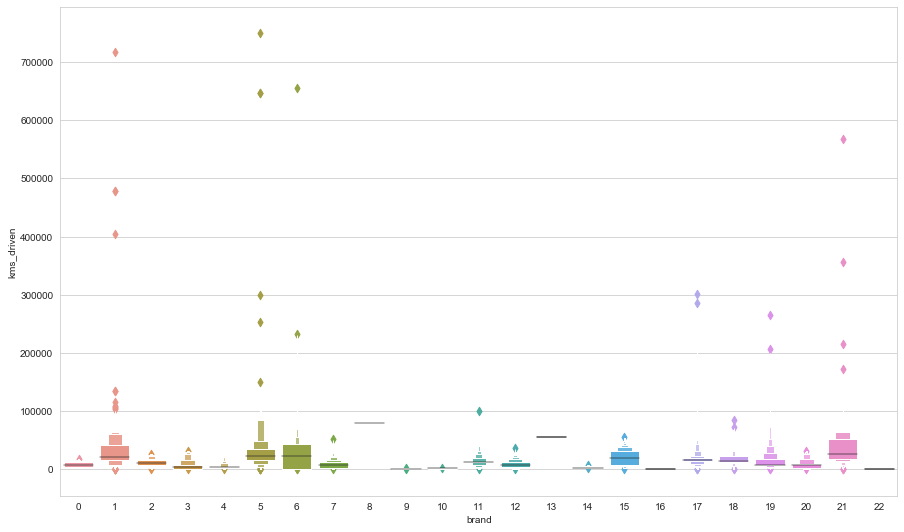

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


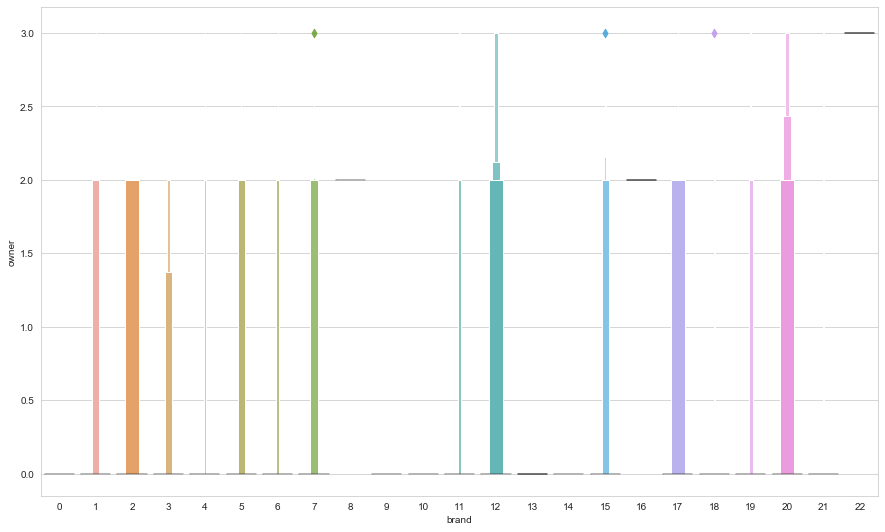

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


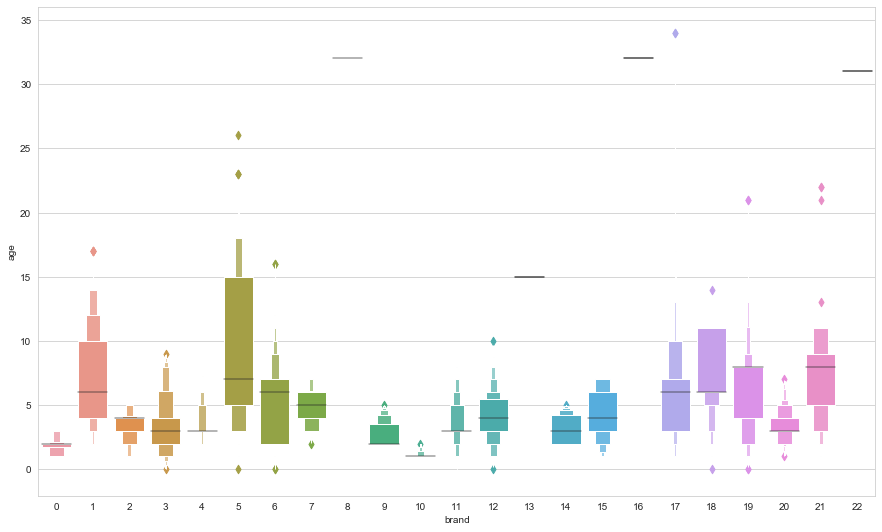

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\seaborn\categorical.py:2619: UserWarning: The `lvplot` function has been renamed to `boxenplot`. The original name will be removed in a future release. Please update your code. 
  warnings.warn(msg)


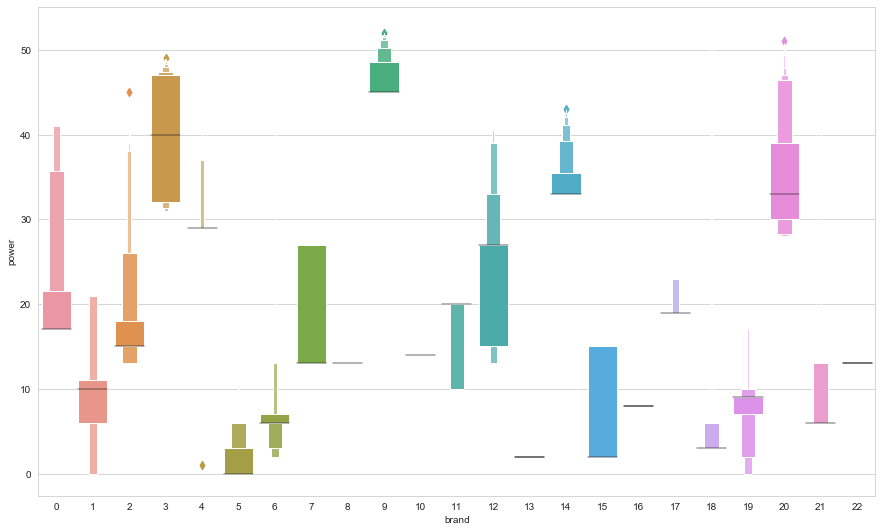

In [82]:
for i in ['bike_name', 'price', 'city', 'kms_driven', 'owner', 'age', 'power']:
    plt.figure(figsize=(15,9))
    sns.lvplot(x=df.brand,y=df[i],data=df,linewidth=1)
    plt.show()

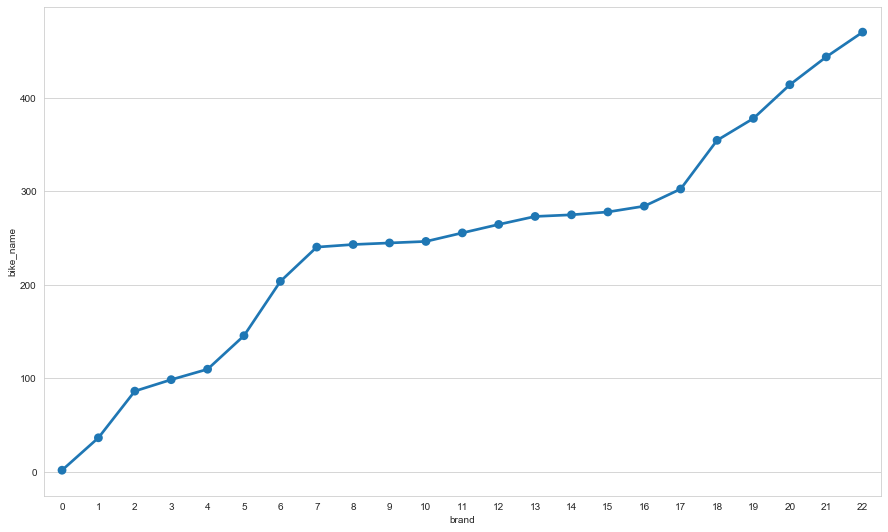

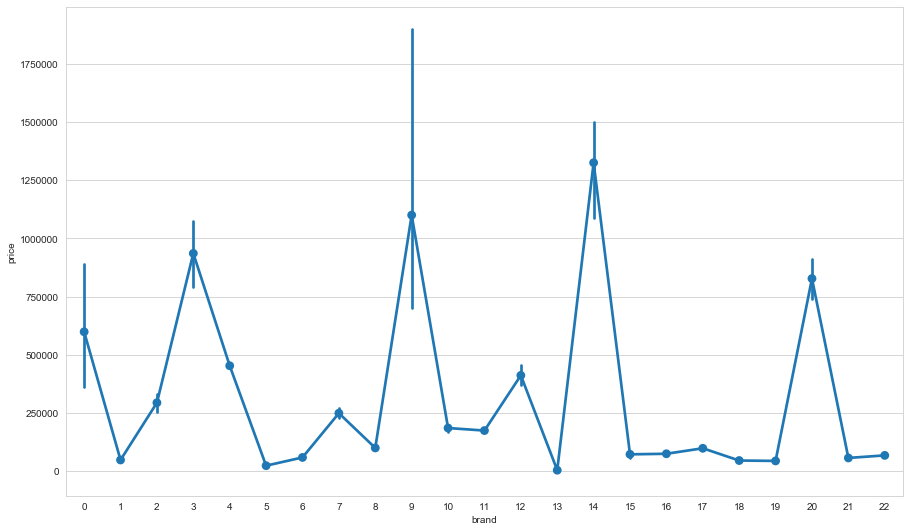

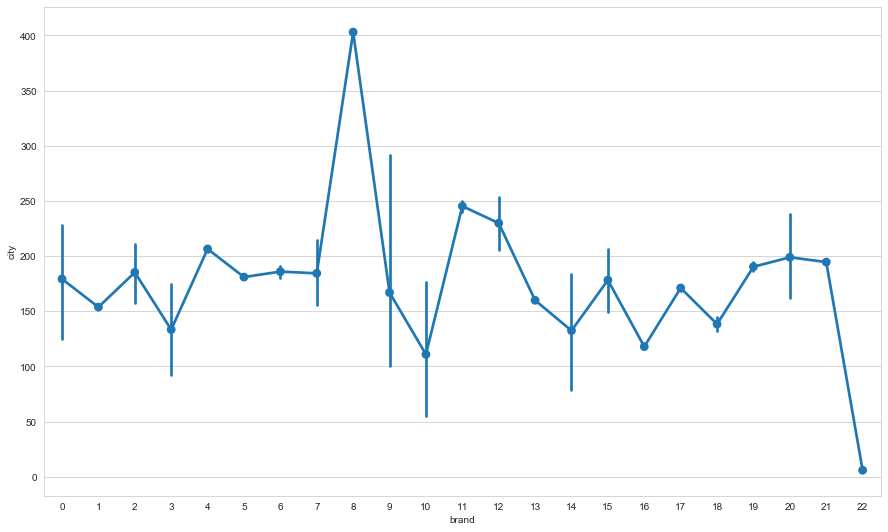

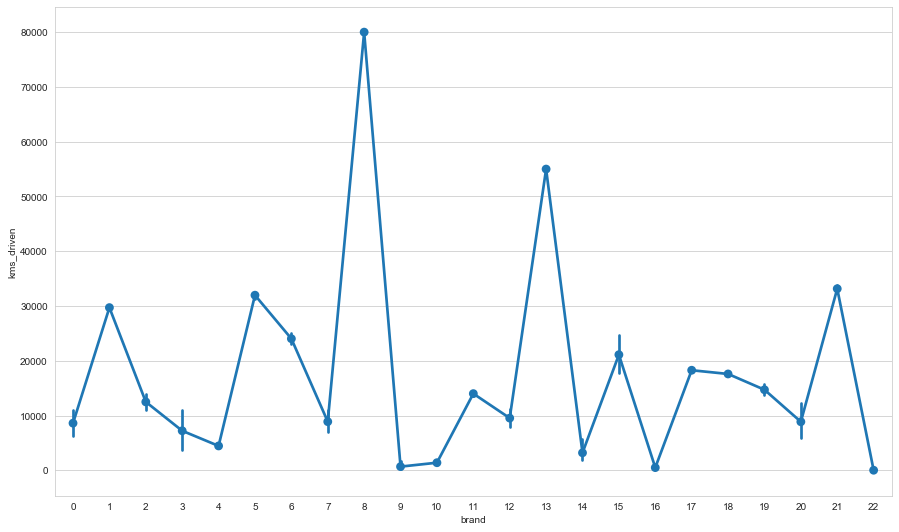

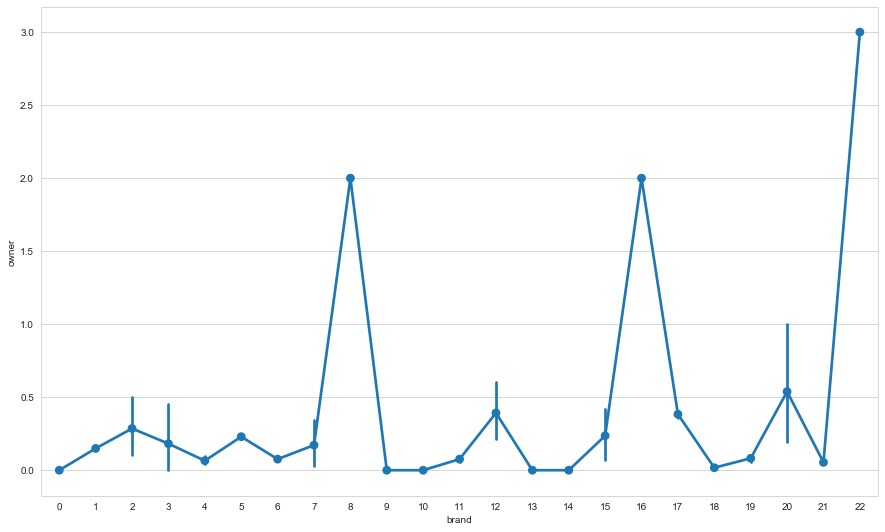

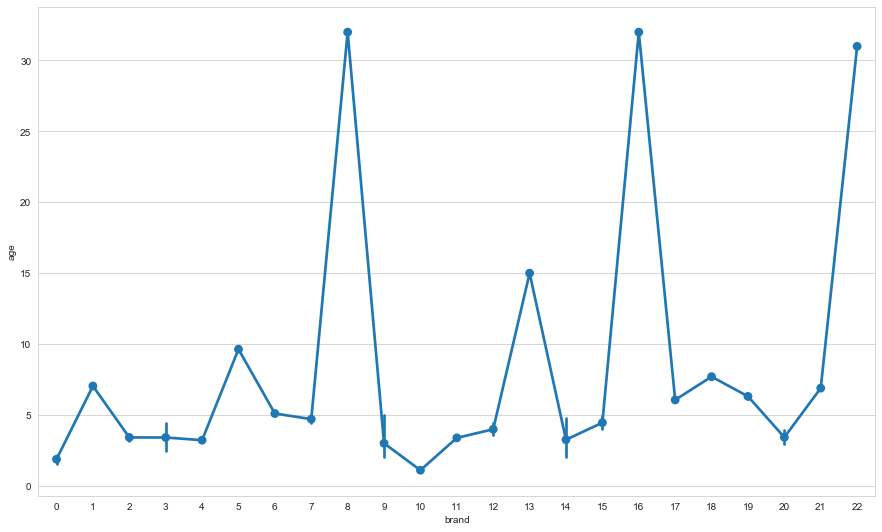

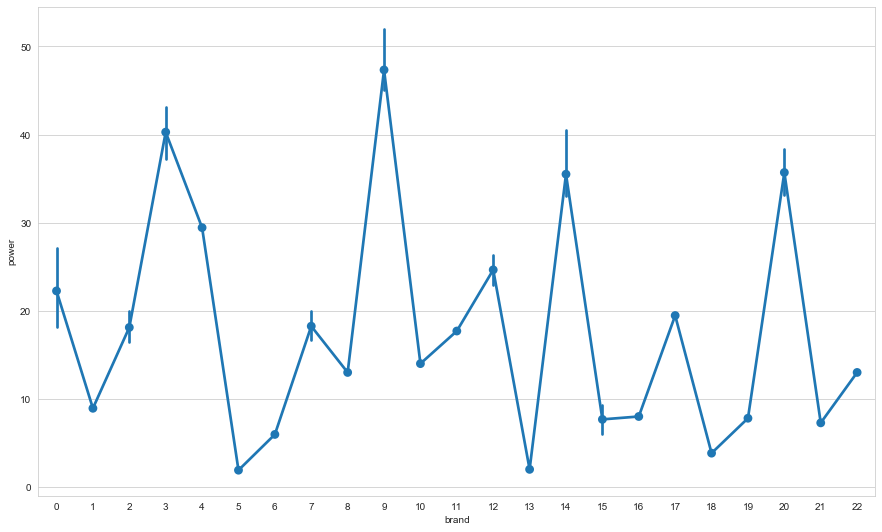

In [83]:
for i in ['bike_name', 'price', 'city', 'kms_driven', 'owner', 'age', 'power']:
    plt.figure(figsize=(15,9))
    sns.pointplot(x=df.brand,y=df[i],data=df,linewidth=1)
    plt.show()

<Figure size 1080x648 with 0 Axes>

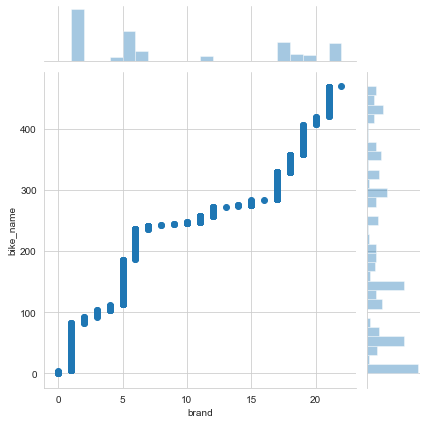

<Figure size 1080x648 with 0 Axes>

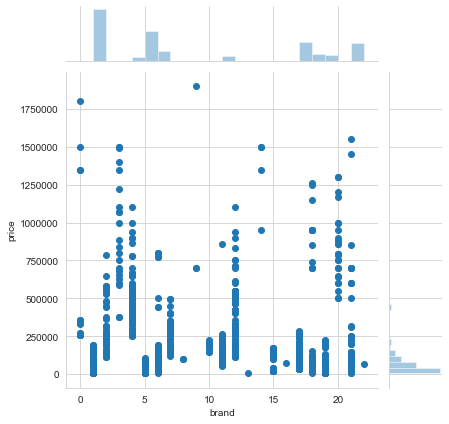

<Figure size 1080x648 with 0 Axes>

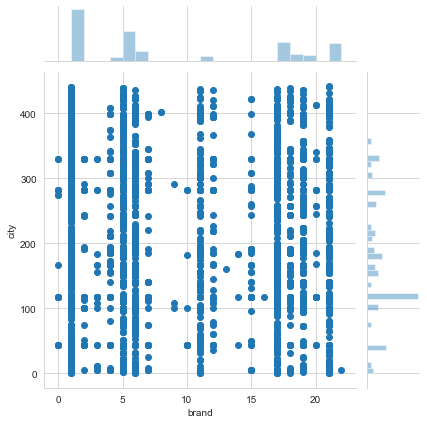

<Figure size 1080x648 with 0 Axes>

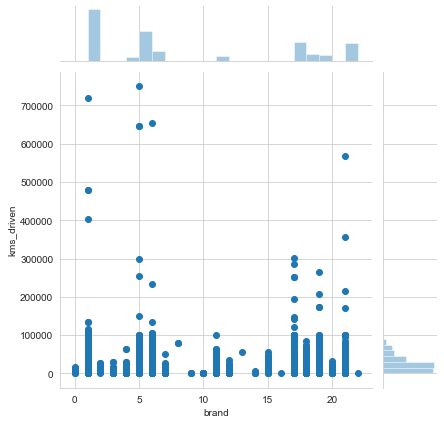

<Figure size 1080x648 with 0 Axes>

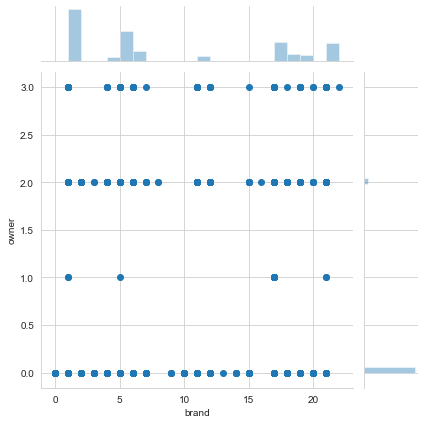

<Figure size 1080x648 with 0 Axes>

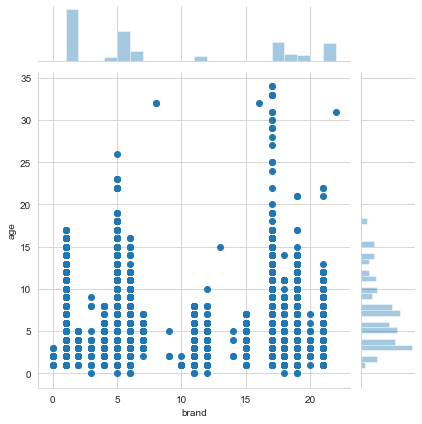

<Figure size 1080x648 with 0 Axes>

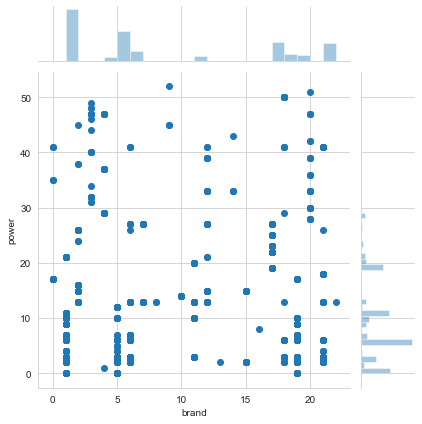

In [86]:
for i in ['bike_name', 'price', 'city', 'kms_driven', 'owner', 'age', 'power']:
    plt.figure(figsize=(15,9))
    sns.jointplot(x=df.brand,y=df[i],data=df,linewidth=1)
    plt.show()

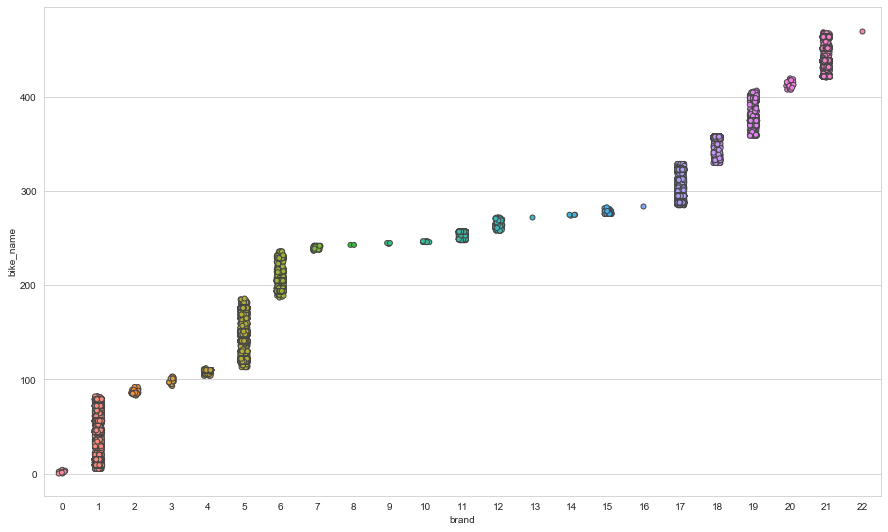

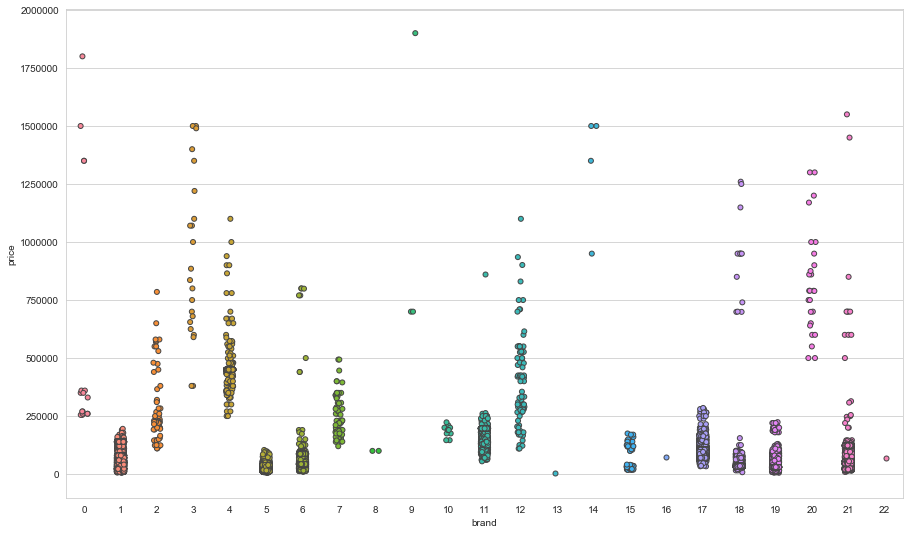

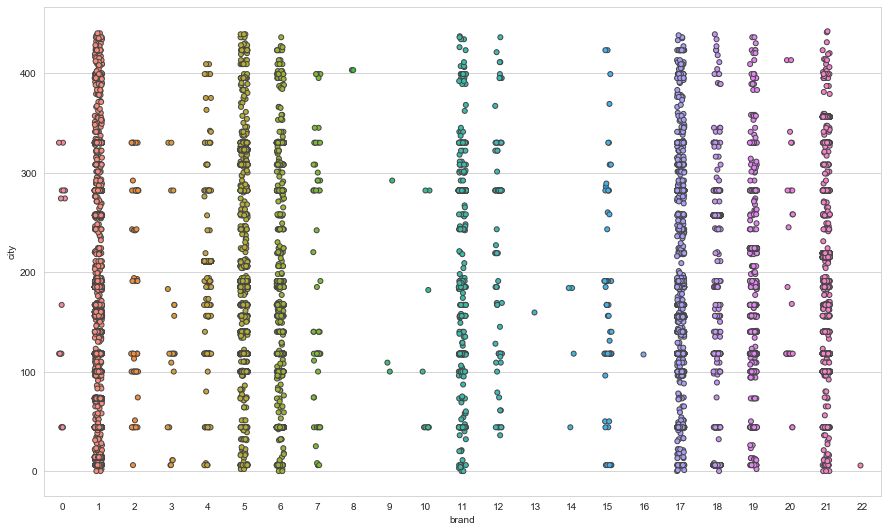

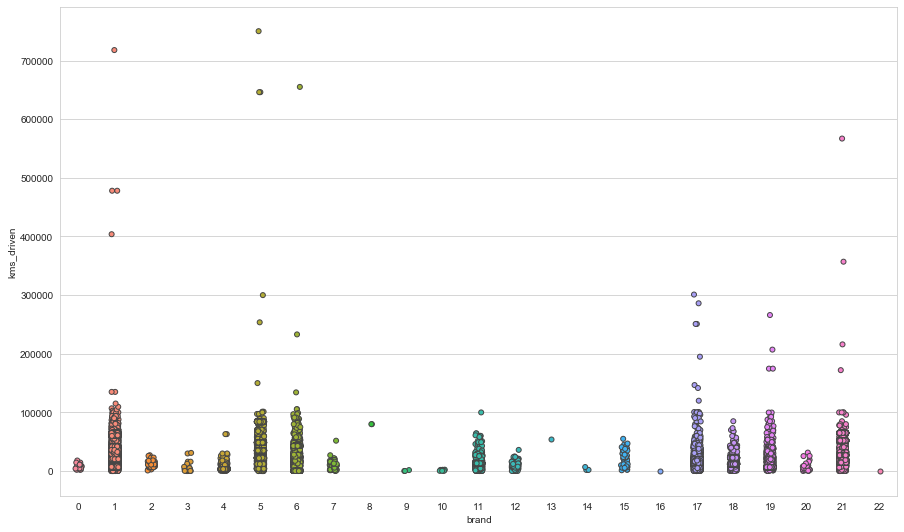

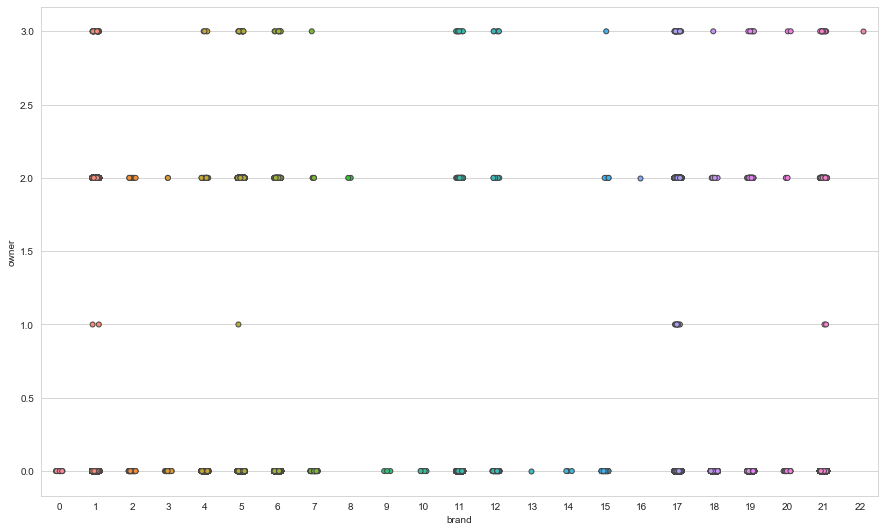

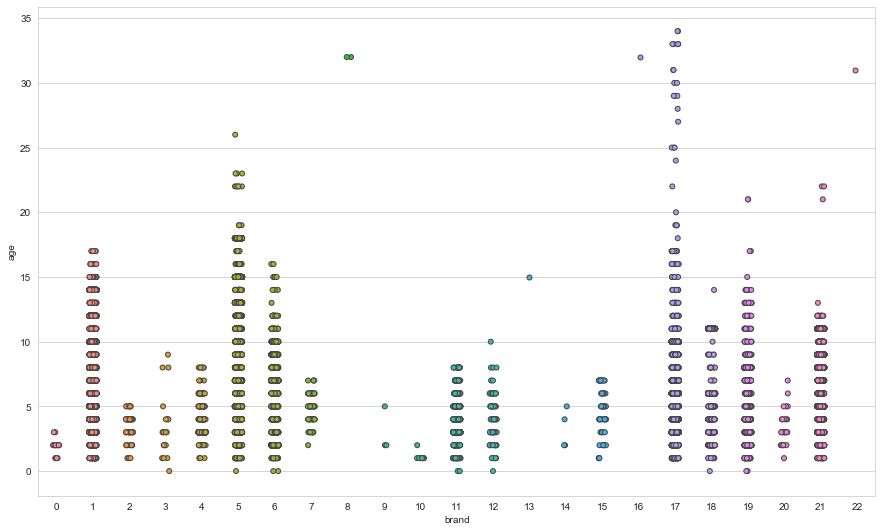

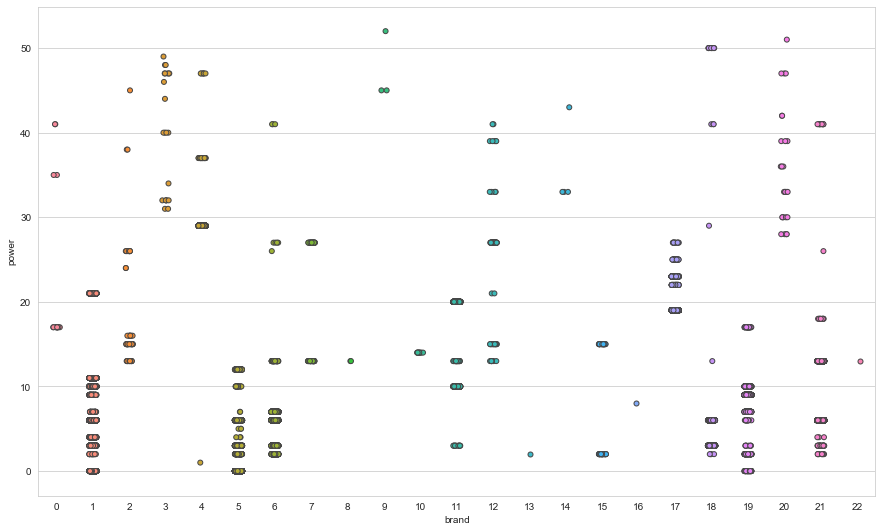

In [87]:
for i in ['bike_name', 'price', 'city', 'kms_driven', 'owner', 'age', 'power']:
    plt.figure(figsize=(15,9))
    sns.stripplot(x=df.brand,y=df[i],data=df,linewidth=1)
    plt.show()

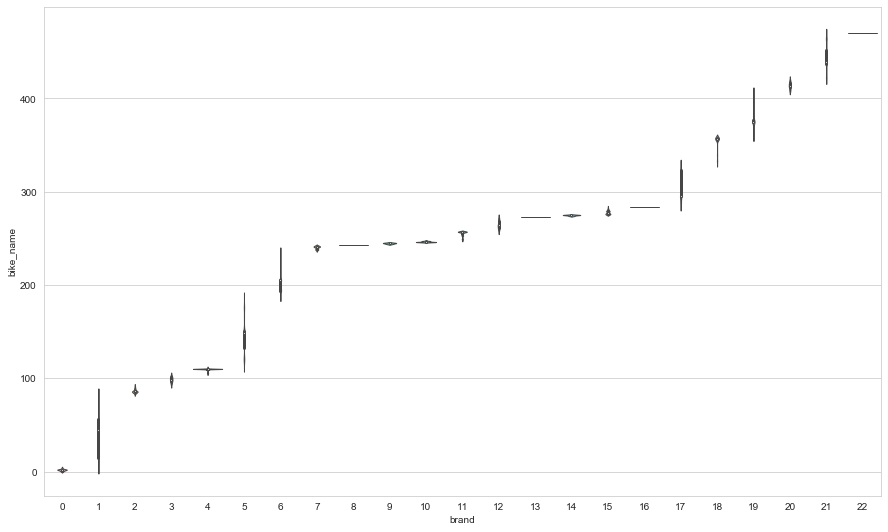

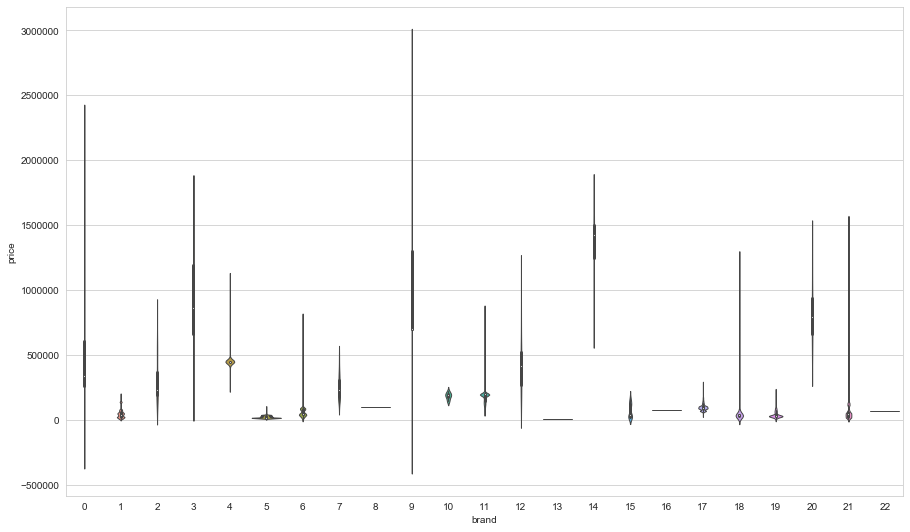

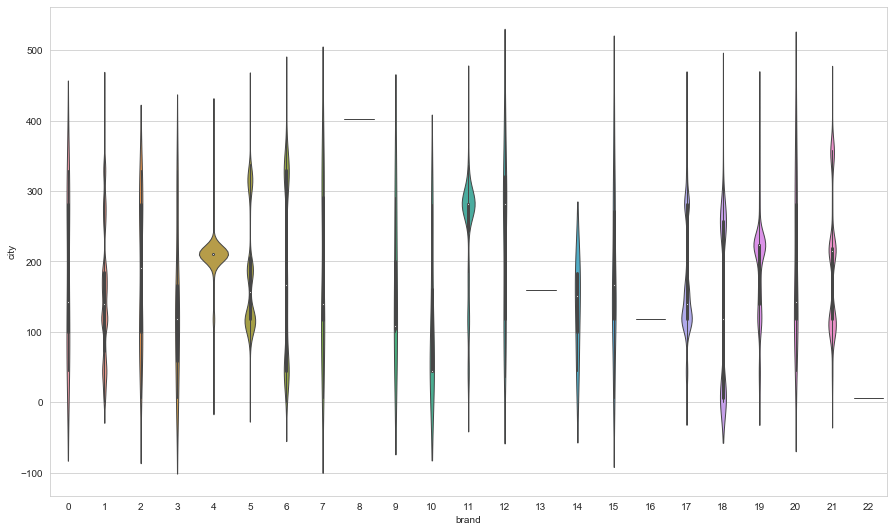

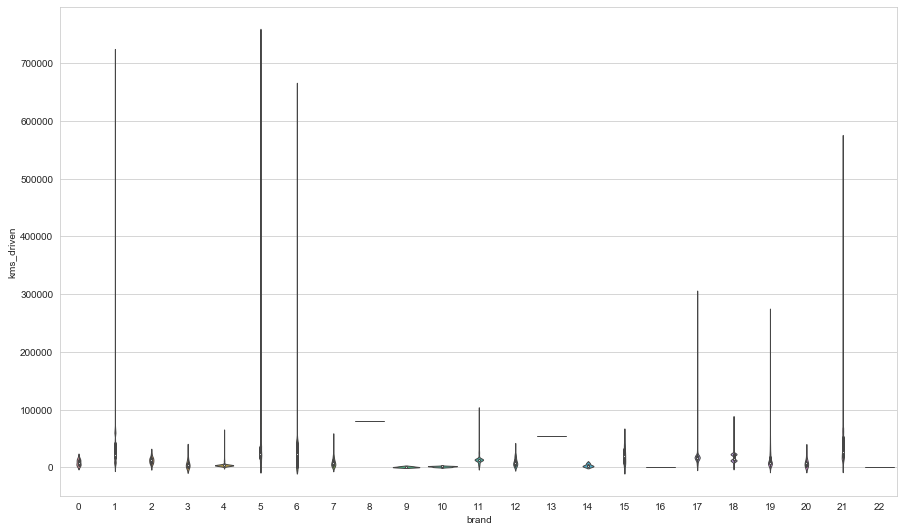

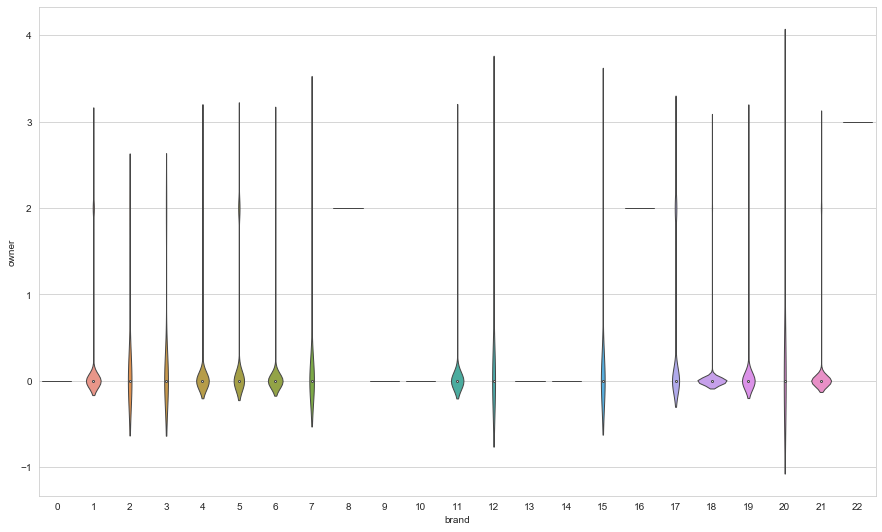

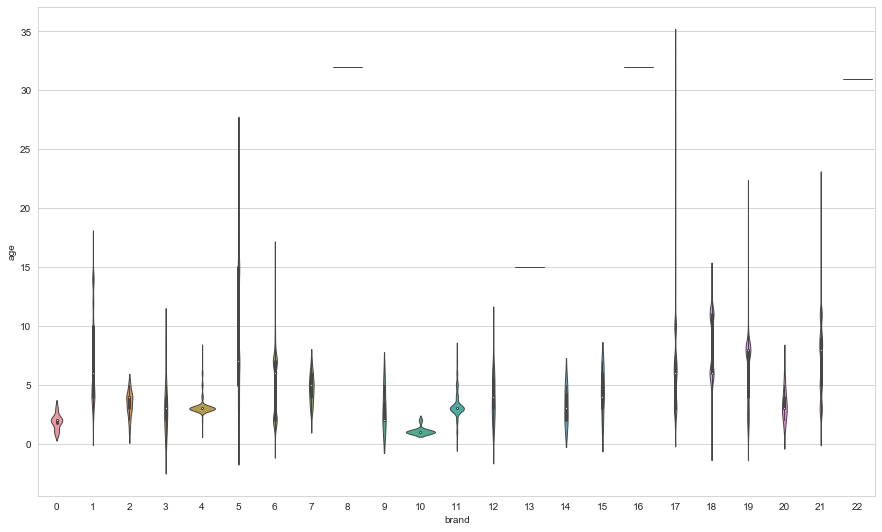

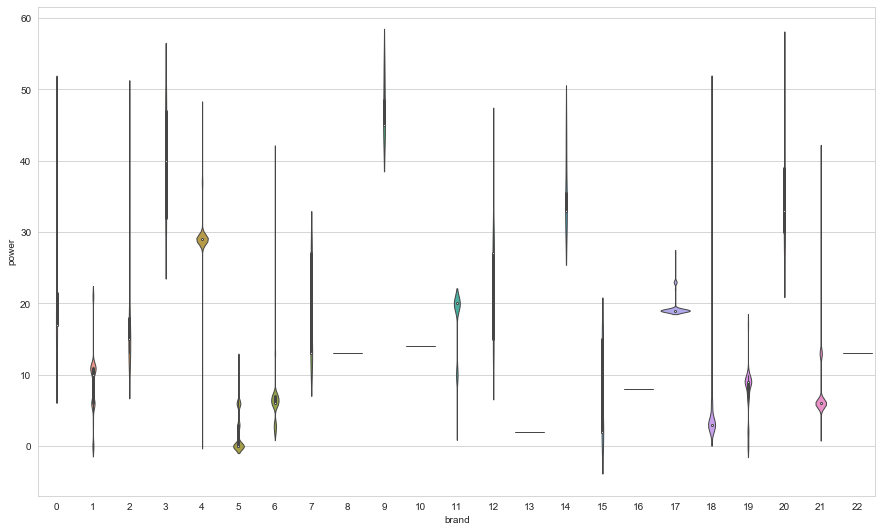

In [88]:
for i in ['bike_name', 'price', 'city', 'kms_driven', 'owner', 'age', 'power']:
    plt.figure(figsize=(15,9))
    sns.violinplot(x=df.brand,y=df[i],data=df,linewidth=1)
    plt.show()

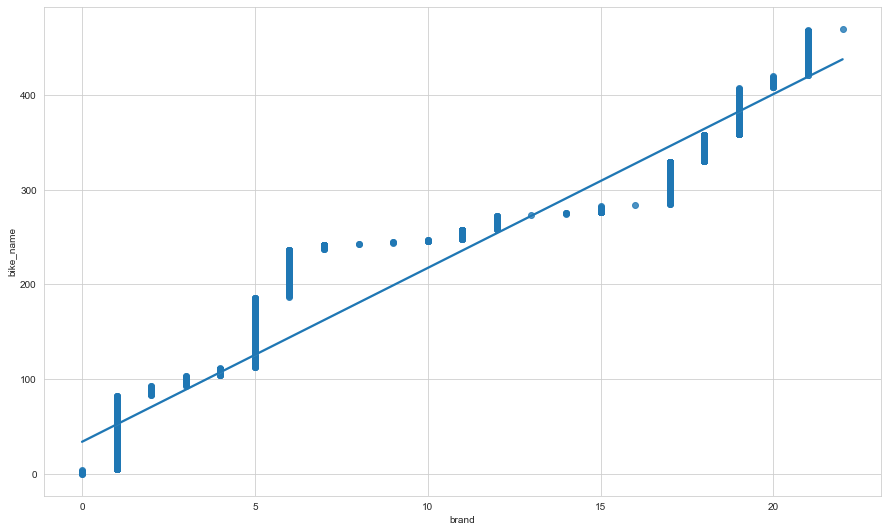

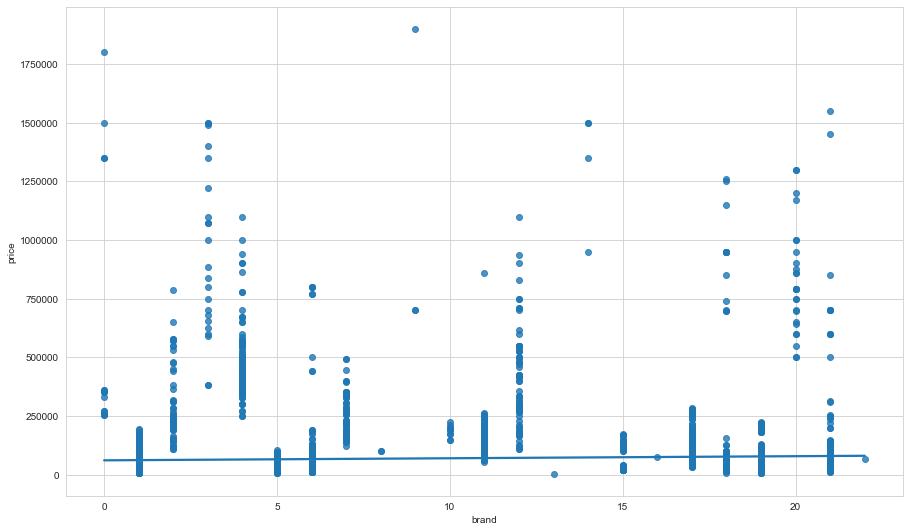

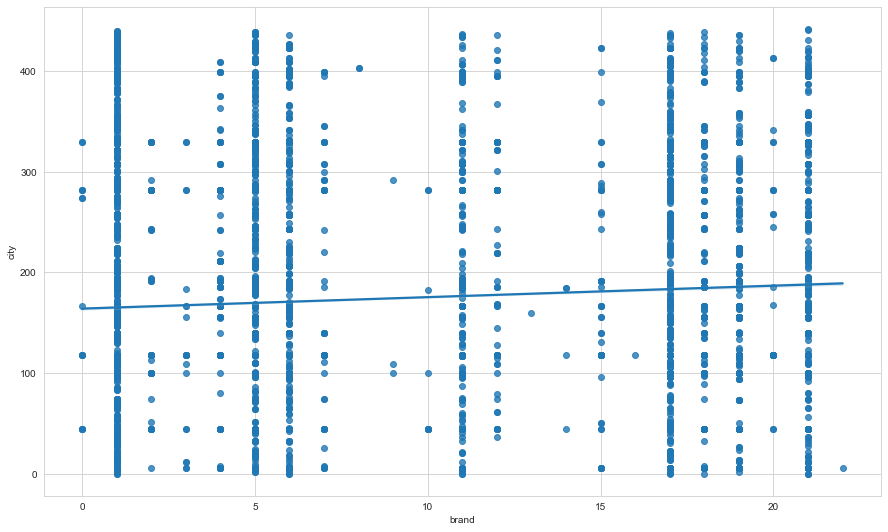

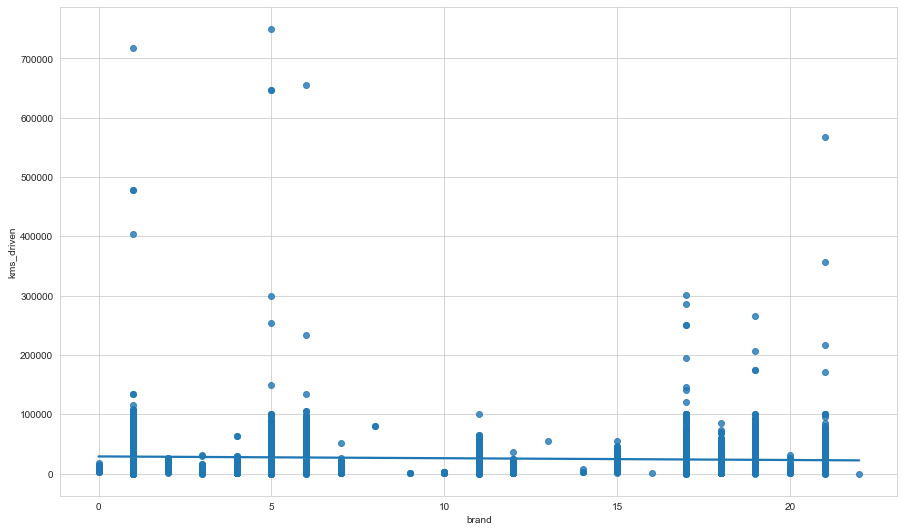

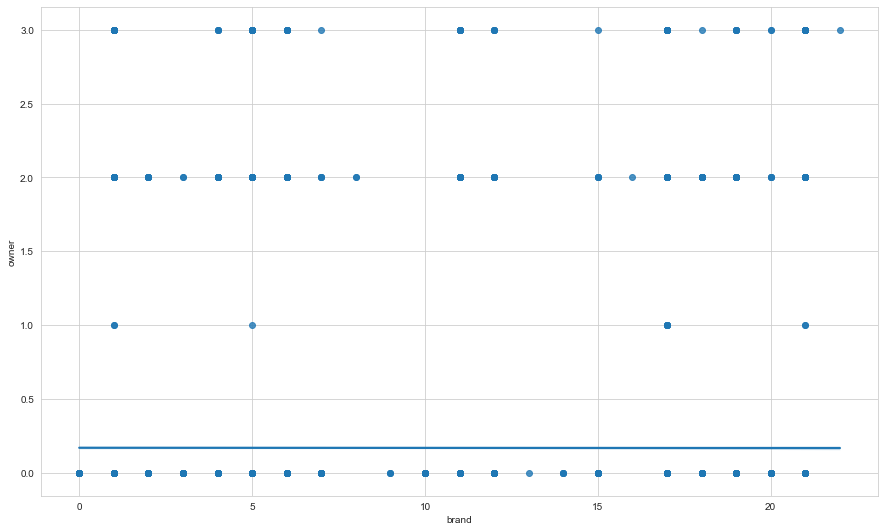

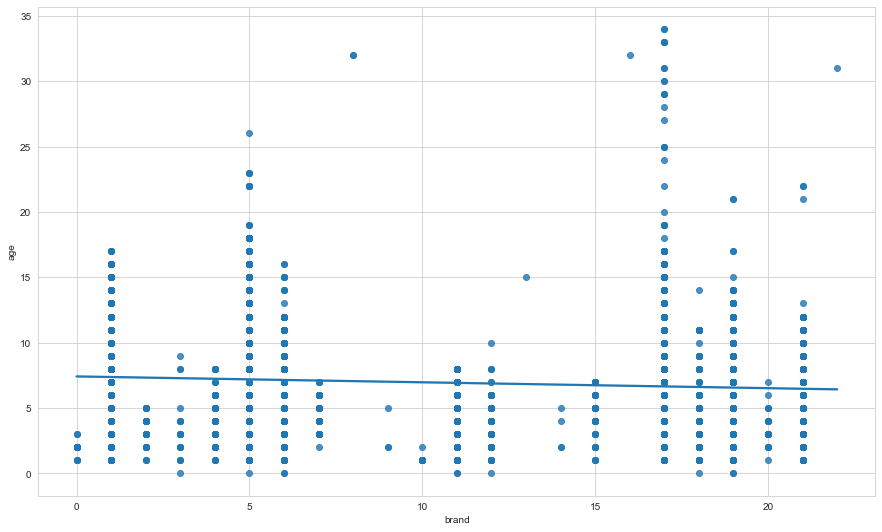

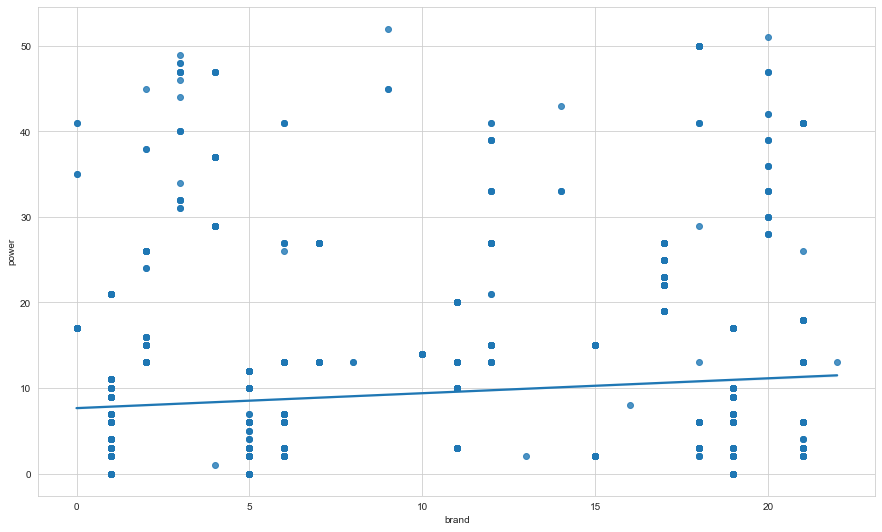

In [90]:
for i in ['bike_name', 'price', 'city', 'kms_driven', 'owner', 'age', 'power']:
    plt.figure(figsize=(15,9))
    sns.regplot(x=df.brand,y=df[i],data=df)
    plt.show()

In [92]:
df.columns

Index(['bike_name', 'price', 'city', 'kms_driven', 'owner', 'age', 'power',
       'brand', 'power by brand', 'power by kms_driven'],
      dtype='object')

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002053A51FFC8>,
      dtype=object)

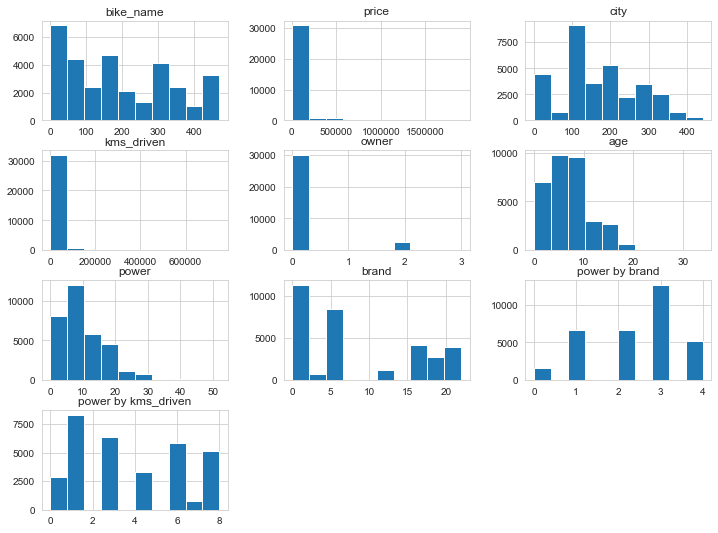

In [100]:
df.hist(figsize=(12,9))

In [101]:
import sweetviz as sv

In [102]:
data=sv.analyze(df)
data.show_html('Analyze.html')

                                             |                                             | [  0%]   00:00 ->…

Report Analyze.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [103]:
from IPython.display import IFrame

In [104]:
IFrame(src='Analyze.html',width=1000,height=600)

In [105]:
df.head()

,bike_name,price,city,kms_driven,owner,age,power,brand,power by brand,power by kms_driven
0,401,35000.0,6,17654.0,0,2,2,19,2,1
1,295,119900.0,118,11000.0,0,3,19,17,4,6
2,411,600000.0,118,110.0,0,7,28,20,4,3
3,375,65000.0,44,16329.0,0,3,9,19,2,6
4,426,80000.0,44,10000.0,0,2,6,21,2,6


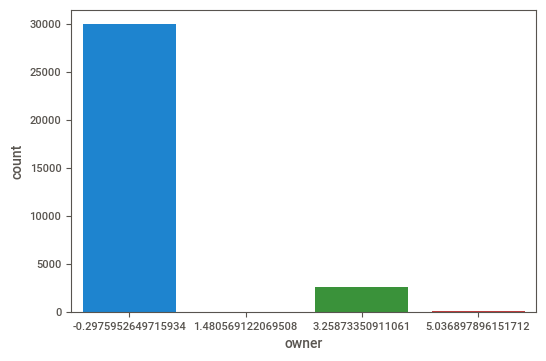

In [113]:
sns.countplot(x='owner', data=df)

In [115]:
import plotly.express as px
plt.figure(figsize=(40,40))
fig = px.scatter_3d(df, x='age', y='kms_driven', z='price', color='brand')
fig.show()

<Figure size 4000x4000 with 0 Axes>

Feature: 0, Score: 0.00050
Feature: 1, Score: 0.00001
Feature: 2, Score: -0.00000
Feature: 3, Score: -0.00386
Feature: 4, Score: -0.00079
Feature: 5, Score: 0.00550
Feature: 6, Score: -0.00978


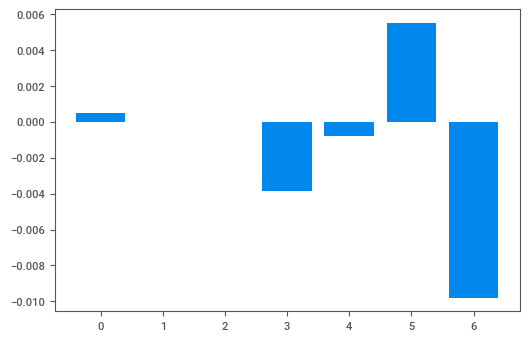

In [117]:
# linear regression feature importance

from sklearn.linear_model import LinearRegression
from matplotlib import pyplot

model = LinearRegression()
# fit the model
model.fit(x, y)
# get importance
importance = model.coef_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance

pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

In [118]:
from statsmodels.api import OLS

model= OLS(ytrain, xtrain).fit()
print(model.summary())

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.783
Model:                            OLS   Adj. R-squared (uncentered):              0.783
Method:                 Least Squares   F-statistic:                          1.178e+04
Date:                Thu, 23 Dec 2021   Prob (F-statistic):                        0.00
Time:                        09:03:41   Log-Likelihood:                     -2.8079e+05
No. Observations:               22853   AIC:                                  5.616e+05
Df Residuals:                   22846   BIC:                                  5.616e+05
Df Model:                           7                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [106]:
df.columns

Index(['bike_name', 'price', 'city', 'kms_driven', 'owner', 'age', 'power',
       'brand', 'power by brand', 'power by kms_driven'],
      dtype='object')

In [107]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

In [108]:
man=MinMaxScaler()
feat=['bike_name', 'price', 'city', 'kms_driven', 'owner', 'age', 'power',
       'brand']
df[feat]=man.fit_transform(df[feat])
df[feat]

,bike_name,price,city,kms_driven,owner,age,power,brand
0,0.853191,0.016143,0.013575,0.023537,0.0,0.058824,0.038462,0.863636
1,0.627660,0.060931,0.266968,0.014665,0.0,0.088235,0.365385,0.772727
2,0.874468,0.314201,0.266968,0.000145,0.0,0.205882,0.538462,0.909091
3,0.797872,0.031969,0.099548,0.021771,0.0,0.088235,0.173077,0.863636
4,0.906383,0.039882,0.099548,0.013332,0.0,0.058824,0.115385,0.954545
...,...,...,...,...,...,...,...,...
32643,0.321277,0.018253,0.266968,0.029332,0.0,0.088235,0.000000,0.227273
32644,0.797872,0.013505,0.506787,0.008851,0.0,0.235294,0.173077,0.863636
32645,0.031915,0.029331,0.266968,0.027163,0.0,0.147059,0.211538,0.045455
32646,0.374468,0.005908,0.432127,0.112247,0.0,0.441176,0.057692,0.227273


In [109]:
std=StandardScaler()
feat=['bike_name', 'price', 'city', 'kms_driven', 'owner', 'age', 'power',
       'brand']
df[feat]=std.fit_transform(df[feat])
df[feat]

,bike_name,price,city,kms_driven,owner,age,power,brand
0,1.456675,-0.367024,-1.737984,-0.391325,-0.297595,-1.265272,-0.972678,1.364828
1,0.726774,0.568851,-0.576557,-0.690945,-0.297595,-1.014327,1.347659,1.105266
2,1.525534,5.861122,-0.576557,-1.181304,-0.297595,-0.010546,2.576073,1.494608
3,1.277643,-0.036326,-1.343928,-0.450988,-0.297595,-1.014327,-0.017245,1.364828
4,1.628822,0.129023,-1.343928,-0.735973,-0.297595,-1.265272,-0.426717,1.624389
...,...,...,...,...,...,...,...,...
32643,-0.264789,-0.322931,-0.576557,-0.195632,-0.297595,-1.014327,-1.245659,-0.452102
32644,1.277643,-0.422141,0.522652,-0.887314,-0.297595,0.240399,-0.017245,1.364828
32645,-1.201266,-0.091443,-0.576557,-0.268893,-0.297595,-0.512436,0.255736,-0.971224
32646,-0.092643,-0.580876,0.180445,2.604507,-0.297595,1.997016,-0.836188,-0.452102
